# GTI770 - Systèmes Intelligents et Apprentissage Machine

#### Alessandro L. Koerich

## Notebook Jupyter - Feature Extraction

### Simpsons Dataset

##### January 2019

In [1]:
# Imports General
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import time
import matplotlib

In [2]:
# Imports Scikit-Learn
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler

In [3]:
# Imports from TP1 GTI770-H2018
import csv
import math
import scipy.ndimage as nd
from scipy.stats.mstats import mquantiles, kurtosis, skew
from sklearn.preprocessing import LabelEncoder

In [4]:
# Import OpenCV
import cv2

In [6]:
# Paths to image files (train and validation sets)
train_path='Simpsons-Train-Valid/Train/'
valid_path='Simpsons-Train-Valid/Valid/'

In [7]:
# Put all image filenames into a list
train_list = os.listdir(train_path)
valid_list = os.listdir(valid_path)

In [8]:
# Create vectors to store the image labels (bart, homer, etc...)
# but we will use numerical labels instead. 
# Our convention will be 'bart' : 0, 'home': 1, 'lisa': 2, 'magg' : 3, 'marg' : 4, 'fami' : 5, 'othe': 6, 'scho' : 7

label_train = np.ones( ( len(train_list) , ), dtype=int)
label_valid = np.ones( ( len(valid_list) , ), dtype=int)

In [9]:
# Let's read each image filename in out list and take the first four characters of the file
dirs = os.listdir( train_path )
i = 0

choices = {'bart' : 0, 'home': 1, 'lisa': 2, 'magg' : 3, 'marg' : 4, 'fami' : 5, 'othe': 6, 'scho' : 7}

for file_name in dirs:
    # Take the first four characters of the file
    class_id = file_name[0:4]
    # print(file_name)
    # print(class_id)
    # Replace the 4-character string by a number according to "choices"
    label_train[i] = choices.get(class_id, 99)
    i += 1

In [10]:
# Create empty feature vectors to store the features that we will extract from images

num_features = 2

# If we want to add the label at the end of the feature vector, we must add a dimension
num_features = num_features + 1

feature_vector = np.zeros( (len(dirs), num_features) )
#, dtype=float)


In [11]:
# CSV file to store the feature vectors and labels

filename = "simpsons_train.csv"

Processing image 1 other022.bmp


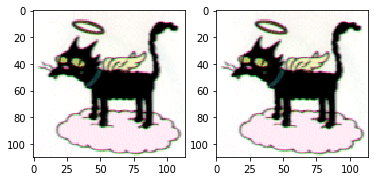

[   0. 3013.    6.]



Processing image 2 maggie027.bmp


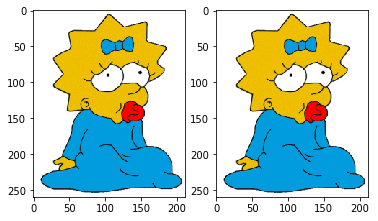

[0.0000e+00 2.6135e+04 3.0000e+00]



Processing image 3 other036.bmp


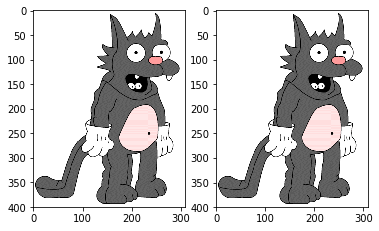

[0.0000e+00 7.6511e+04 6.0000e+00]



Processing image 4 bart002.bmp


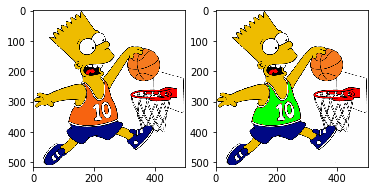

[  9434. 171167.      0.]



Processing image 5 bart016.bmp


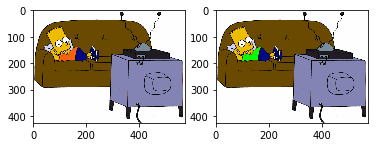

[  1771. 102062.      0.]



Processing image 6 lisa021.bmp


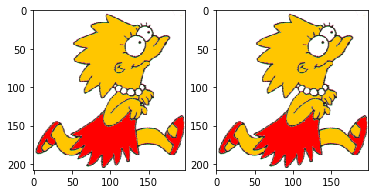

[0.0000e+00 2.3429e+04 2.0000e+00]



Processing image 7 lisa009.bmp


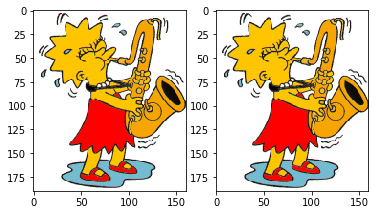

[0.0000e+00 1.5276e+04 2.0000e+00]



Processing image 8 family003.bmp


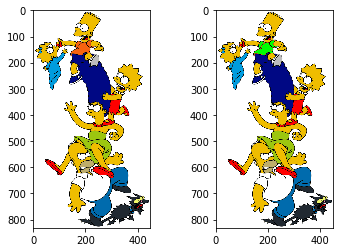

[2.29500e+03 2.45477e+05 5.00000e+00]



Processing image 9 family017.bmp


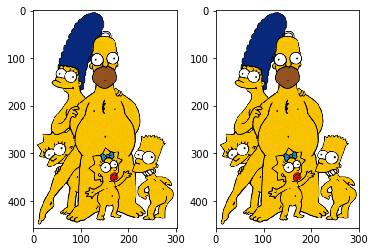

[0.0000e+00 6.7818e+04 5.0000e+00]



Processing image 10 homer051.bmp


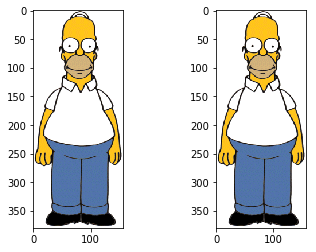

[0.0000e+00 3.3987e+04 1.0000e+00]



Processing image 11 homer045.bmp


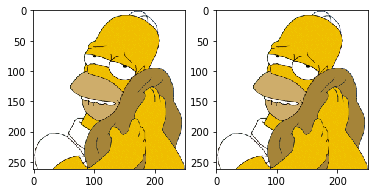

[0.0000e+00 3.0643e+04 1.0000e+00]



Processing image 12 homer044.bmp


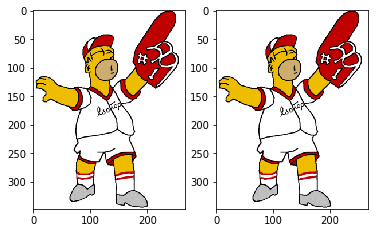

[0.0000e+00 6.8991e+04 1.0000e+00]



Processing image 13 homer050.bmp


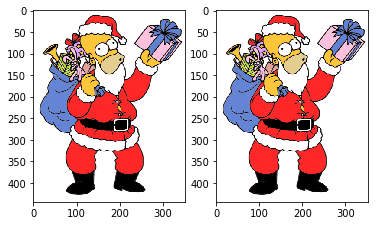

[0.0000e+00 9.0467e+04 1.0000e+00]



Processing image 14 family016.bmp


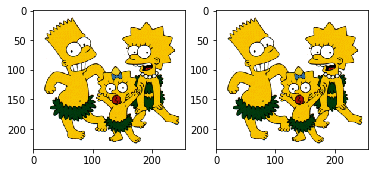

[0.0000e+00 3.3607e+04 5.0000e+00]



Processing image 15 family002.bmp


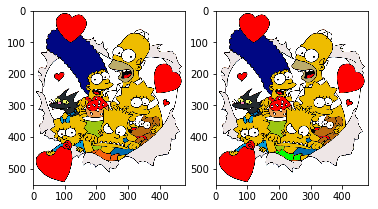

[1.18700e+03 1.24525e+05 5.00000e+00]



Processing image 16 lisa008.bmp


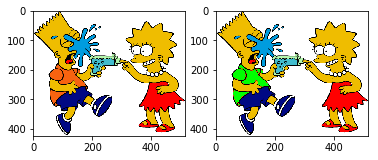

[5.20900e+03 1.27616e+05 2.00000e+00]



Processing image 17 lisa020.bmp


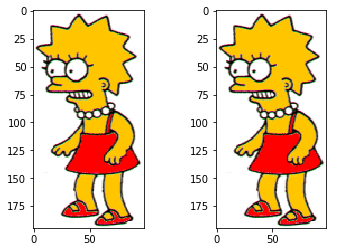

[0.000e+00 8.861e+03 2.000e+00]



Processing image 18 bart017.bmp


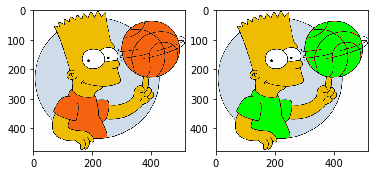

[42247. 91913.     0.]



Processing image 19 bart003.bmp


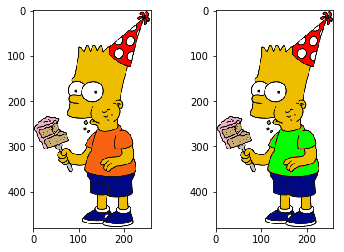

[ 6715. 78982.     0.]



Processing image 20 other037.bmp


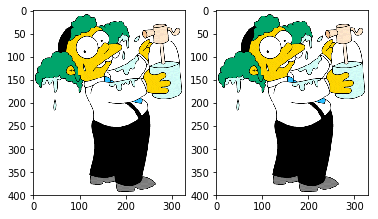

[0.0000e+00 8.4354e+04 6.0000e+00]



Processing image 21 other023.bmp


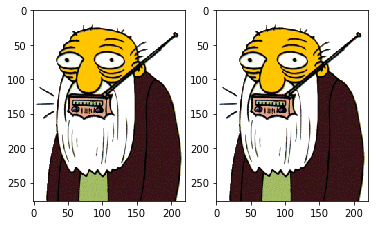

[0.0000e+00 2.8759e+04 6.0000e+00]



Processing image 22 maggie026.bmp


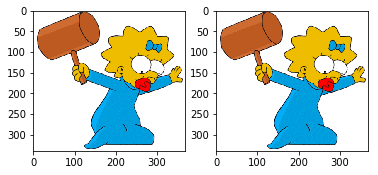

[0.0000e+00 7.3304e+04 3.0000e+00]



Processing image 23 other035.bmp


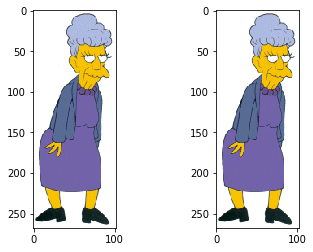

[0.0000e+00 1.2949e+04 6.0000e+00]



Processing image 24 maggie030.bmp


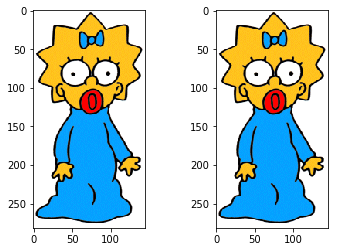

[0.0000e+00 1.6584e+04 3.0000e+00]



Processing image 25 maggie024.bmp


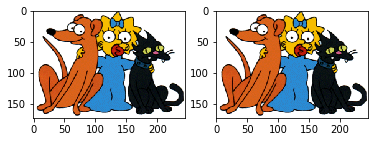

[0.0000e+00 1.7141e+04 3.0000e+00]



Processing image 26 other021.bmp


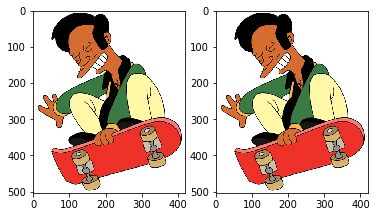

[0.00000e+00 1.07282e+05 6.00000e+00]



Processing image 27 other009.bmp


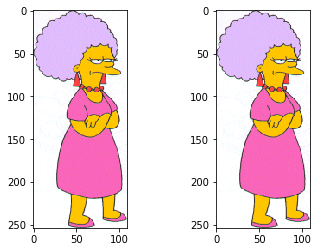

[0.000e+00 8.257e+03 6.000e+00]



Processing image 28 maggie018.bmp


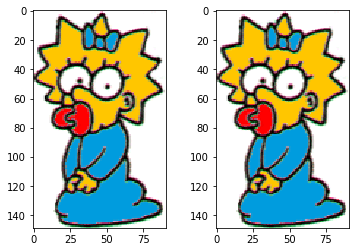

[0.000e+00 4.783e+03 3.000e+00]



Processing image 29 bart015.bmp


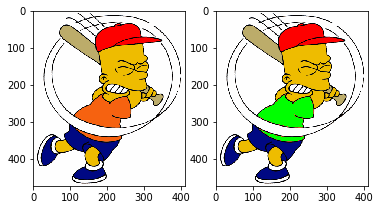

[  9097. 131444.      0.]



Processing image 30 bart001.bmp


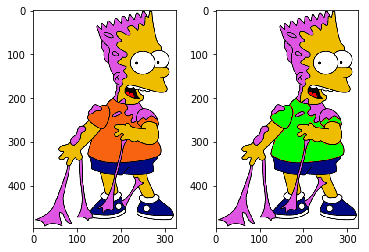

[11157. 97802.     0.]



Processing image 31 bart029.bmp


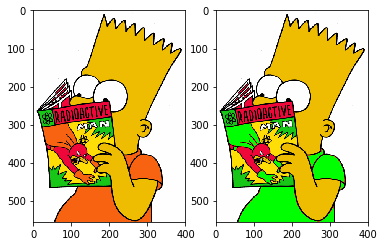

[ 22081. 101146.      0.]



Processing image 32 lisa022.bmp


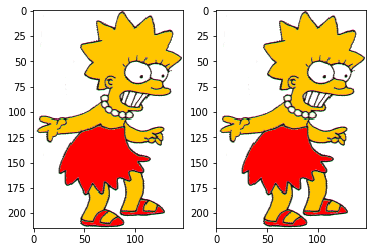

[0.0000e+00 1.7538e+04 2.0000e+00]



Processing image 33 family014.bmp


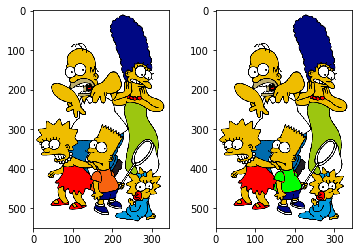

[2.30100e+03 1.05184e+05 5.00000e+00]



Processing image 34 homer046.bmp


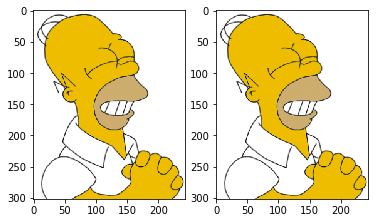

[0.0000e+00 4.2617e+04 1.0000e+00]



Processing image 35 homer052.bmp


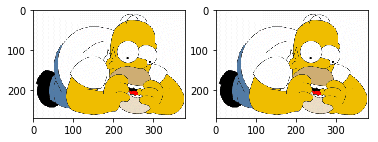

[0.0000e+00 4.6158e+04 1.0000e+00]



Processing image 36 homer053.bmp


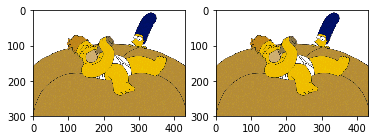

[0.0000e+00 4.3776e+04 1.0000e+00]



Processing image 37 homer047.bmp


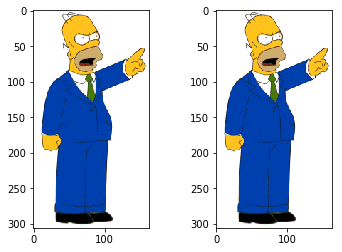

[0.0000e+00 2.7826e+04 1.0000e+00]



Processing image 38 family001.bmp


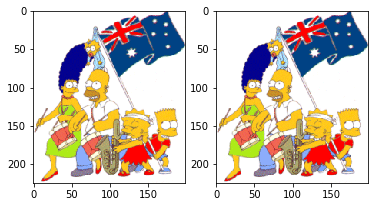

[0.0000e+00 2.1159e+04 5.0000e+00]



Processing image 39 family015.bmp


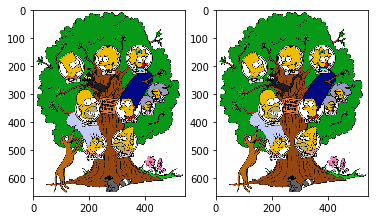

[1.72000e+02 1.38632e+05 5.00000e+00]



Processing image 40 lisa023.bmp


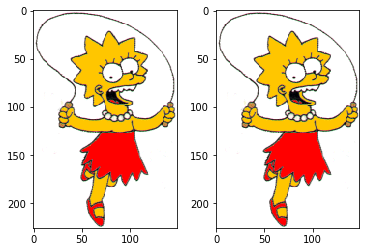

[0.0000e+00 2.2506e+04 2.0000e+00]



Processing image 41 bart028.bmp


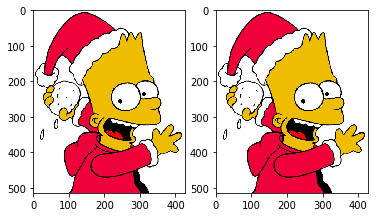

[     0. 118887.      0.]



Processing image 42 bart014.bmp


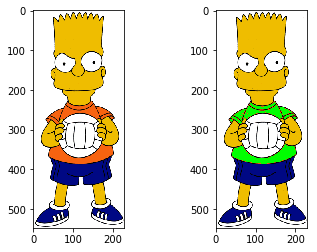

[ 6461. 69682.     0.]



Processing image 43 maggie019.bmp


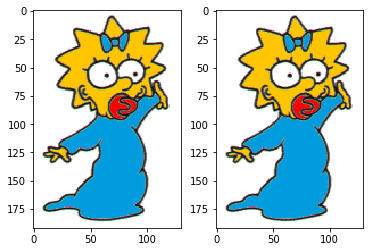

[0.0000e+00 1.3021e+04 3.0000e+00]



Processing image 44 other008.bmp


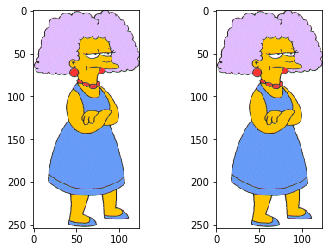

[0.0000e+00 1.3147e+04 6.0000e+00]



Processing image 45 maggie025.bmp


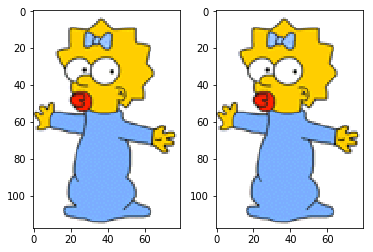

[0.000e+00 5.039e+03 3.000e+00]



Processing image 46 other020.bmp


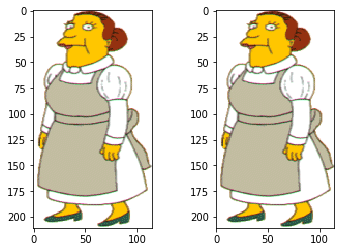

[0.0000e+00 1.0923e+04 6.0000e+00]



Processing image 47 other034.bmp


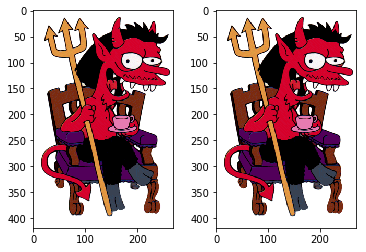

[0.0000e+00 4.9942e+04 6.0000e+00]



Processing image 48 maggie009.bmp


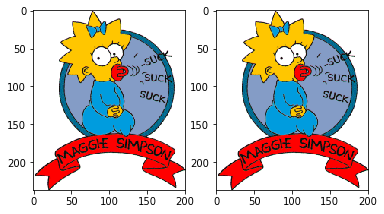

[0.0000e+00 2.2374e+04 3.0000e+00]



Processing image 49 other018.bmp


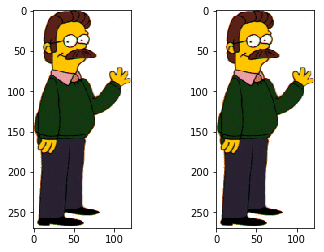

[0.0000e+00 1.6075e+04 6.0000e+00]



Processing image 50 other030.bmp


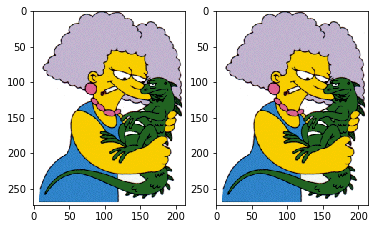

[0.0000e+00 1.8272e+04 6.0000e+00]



Processing image 51 other024.bmp


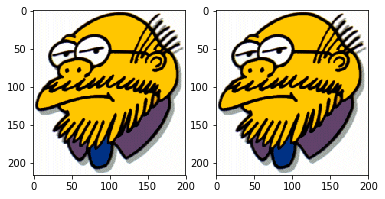

[0.000e+00 8.131e+03 6.000e+00]



Processing image 52 maggie021.bmp


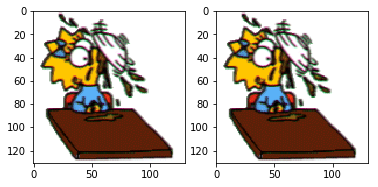

[0.000e+00 8.715e+03 3.000e+00]



Processing image 53 bart038.bmp


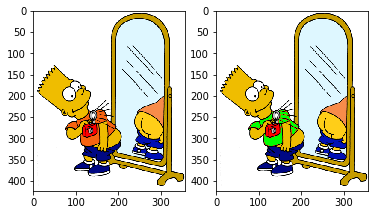

[ 2024. 81079.     0.]



Processing image 54 bart010.bmp


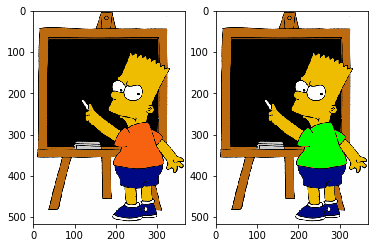

[ 9548. 71855.     0.]



Processing image 55 bart004.bmp


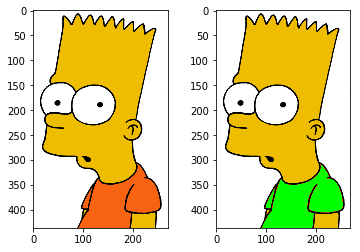

[11392. 54528.     0.]



Processing image 56 lisa027.bmp


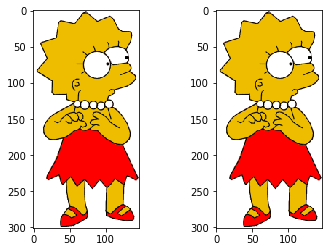

[0.0000e+00 1.8583e+04 2.0000e+00]



Processing image 57 lisa033.bmp


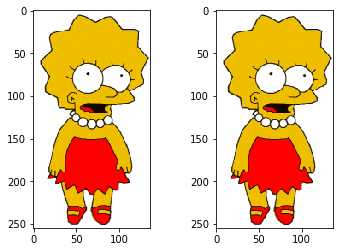

[0.0000e+00 1.6553e+04 2.0000e+00]



Processing image 58 homer043.bmp


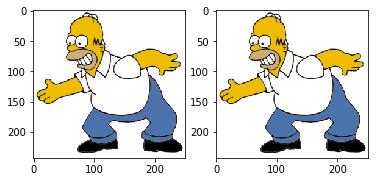

[    0. 41929.    99.]



Processing image 59 homer057.bmp


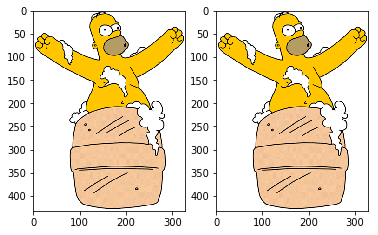

[0.0000e+00 7.7038e+04 1.0000e+00]



Processing image 60 family011.bmp


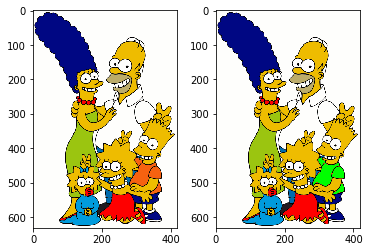

[3.911e+03 0.000e+00 1.000e+00]



Processing image 61 family005.bmp


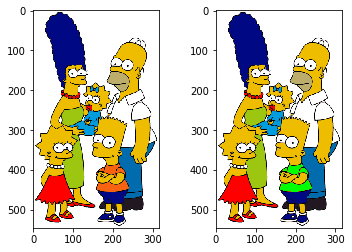

[2.2810e+03 8.6305e+04 5.0000e+00]



Processing image 62 family004.bmp


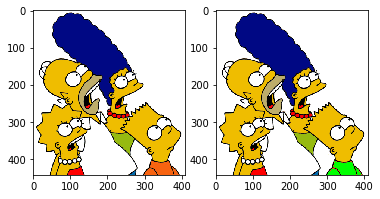

[2.1470e+03 9.9907e+04 5.0000e+00]



Processing image 63 family010.bmp


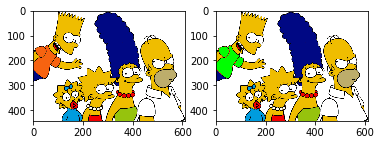

[7.76600e+03 1.39273e+05 5.00000e+00]



Processing image 64 homer056.bmp


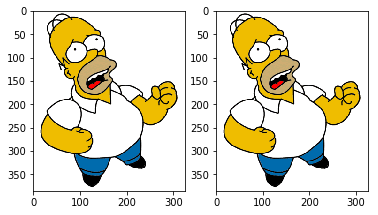

[0.000e+00 9.102e+04 5.000e+00]



Processing image 65 homer042.bmp


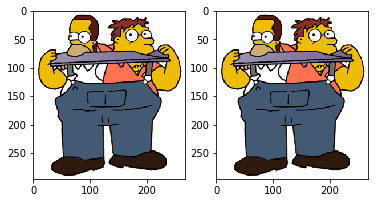

[0.0000e+00 3.2683e+04 1.0000e+00]



Processing image 66 lisa032.bmp


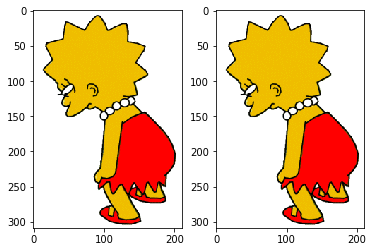

[0.0000e+00 3.6805e+04 1.0000e+00]



Processing image 67 lisa026.bmp


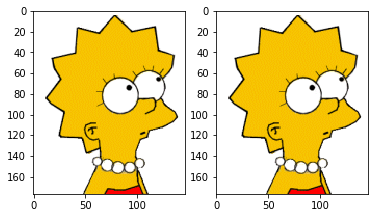

[0.0000e+00 1.3511e+04 2.0000e+00]



Processing image 68 bart005.bmp


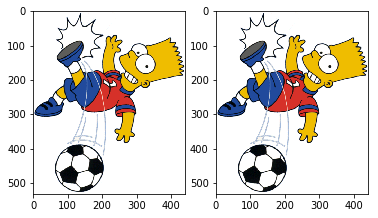

[0.00000e+00 1.65272e+05 2.00000e+00]



Processing image 69 bart011.bmp


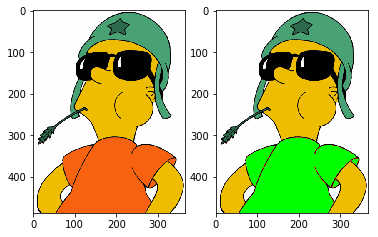

[35005. 71093.     0.]



Processing image 70 bart039.bmp


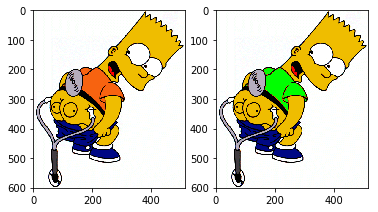

[  9338. 146620.      0.]



Processing image 71 other025.bmp


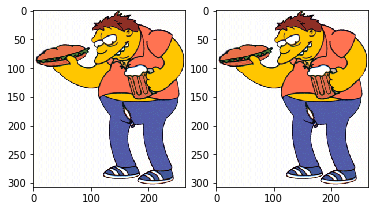

[    0. 25735.     0.]



Processing image 72 maggie020.bmp


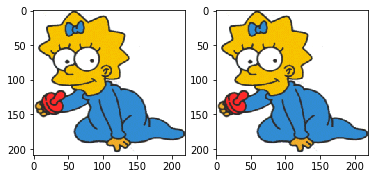

[0.0000e+00 2.5288e+04 6.0000e+00]



Processing image 73 other031.bmp


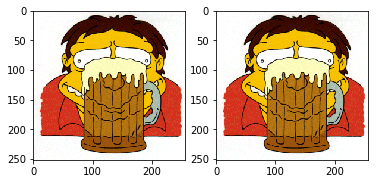

[0.0000e+00 1.2743e+04 3.0000e+00]



Processing image 74 other019.bmp


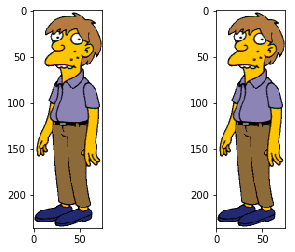

[0.000e+00 7.016e+03 6.000e+00]



Processing image 75 maggie008.bmp


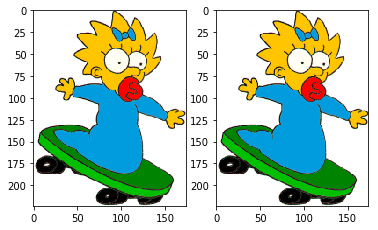

[0.0000e+00 1.9127e+04 6.0000e+00]



Processing image 76 maggie022.bmp


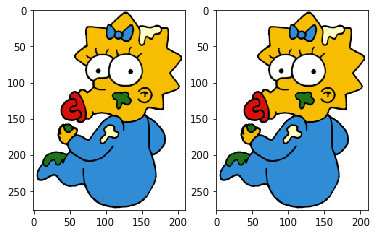

[0.0000e+00 2.8065e+04 3.0000e+00]



Processing image 77 other027.bmp


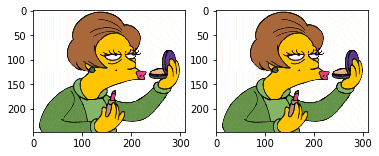

[0.0000e+00 2.2783e+04 3.0000e+00]



Processing image 78 other033.bmp


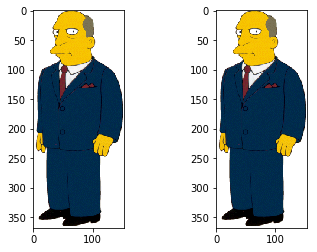

[0.0000e+00 1.9351e+04 6.0000e+00]



Processing image 79 bart007.bmp


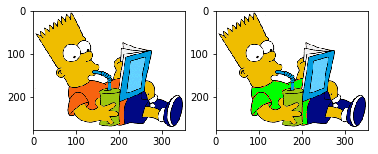

[4.2920e+03 5.7222e+04 6.0000e+00]



Processing image 80 bart013.bmp


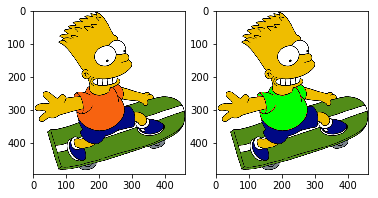

[ 13124. 129843.      0.]



Processing image 81 lisa018.bmp


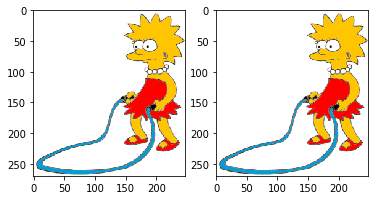

[3.0000e+00 4.9998e+04 0.0000e+00]



Processing image 82 lisa030.bmp


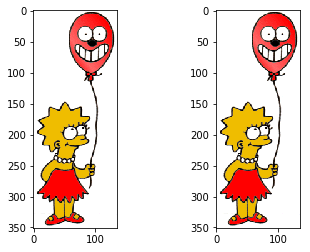

[0.000e+00 3.078e+04 2.000e+00]



Processing image 83 lisa024.bmp


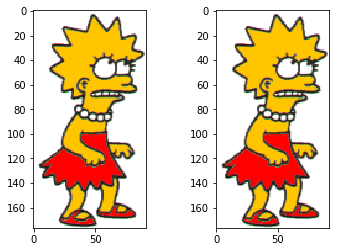

[0.000e+00 7.901e+03 2.000e+00]



Processing image 84 homer054.bmp


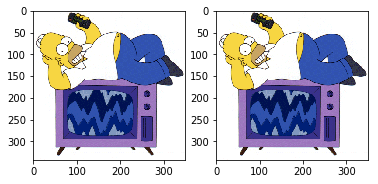

[0.0000e+00 5.4444e+04 2.0000e+00]



Processing image 85 homer040.bmp


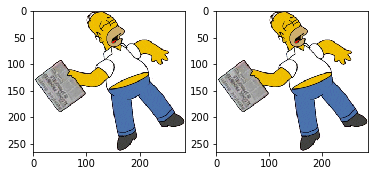

[0.0000e+00 5.3307e+04 1.0000e+00]



Processing image 86 family006.bmp


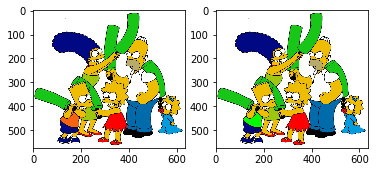

[2.78200e+03 2.11064e+05 1.00000e+00]



Processing image 87 family012.bmp


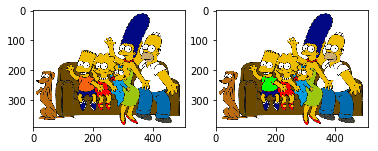

[1.85400e+03 1.03194e+05 5.00000e+00]



Processing image 88 family013.bmp


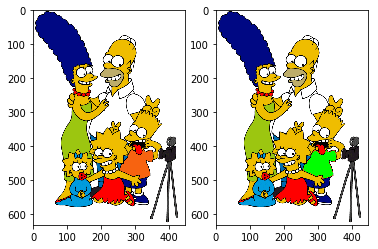

[5.05600e+03 1.73683e+05 5.00000e+00]



Processing image 89 family007.bmp


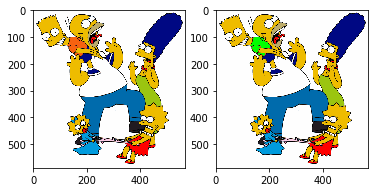

[2.48500e+03 2.15525e+05 5.00000e+00]



Processing image 90 homer041.bmp


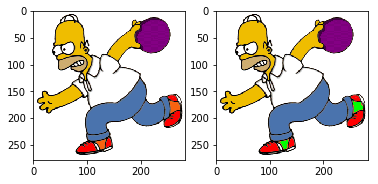

[4.150e+02 5.144e+04 5.000e+00]



Processing image 91 homer055.bmp


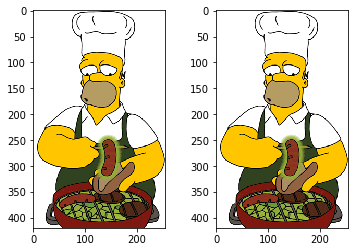

[0.000e+00 5.815e+04 1.000e+00]



Processing image 92 lisa025.bmp


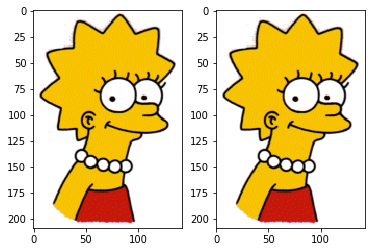

[0.0000e+00 1.4294e+04 1.0000e+00]



Processing image 93 lisa031.bmp


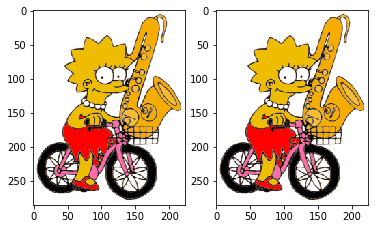

[0.0000e+00 3.3859e+04 2.0000e+00]



Processing image 94 lisa019.bmp


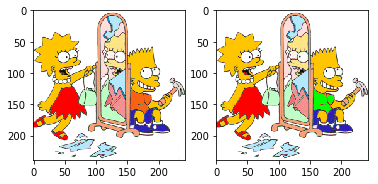

[6.970e+02 3.008e+04 2.000e+00]



Processing image 95 bart012.bmp


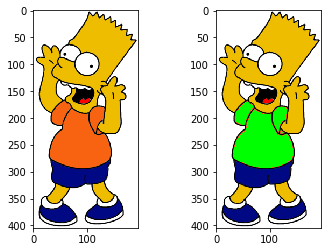

[9.3880e+03 3.5761e+04 2.0000e+00]



Processing image 96 bart006.bmp


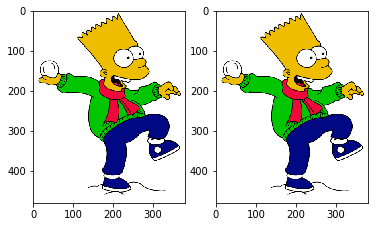

[     0. 127412.      0.]



Processing image 97 other032.bmp


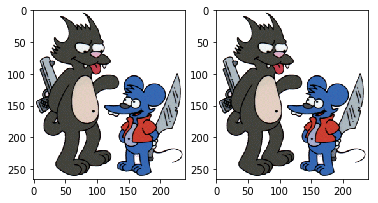

[    0. 33829.     0.]



Processing image 98 maggie023.bmp


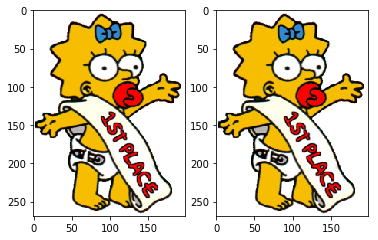

[0.0000e+00 2.7171e+04 6.0000e+00]



Processing image 99 other026.bmp


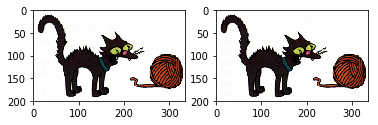

[0.0000e+00 2.8352e+04 3.0000e+00]



Processing image 100 other041.bmp


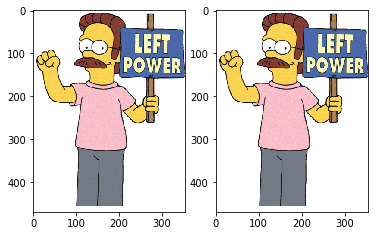

[0.0000e+00 9.2041e+04 6.0000e+00]



Processing image 101 other055.bmp


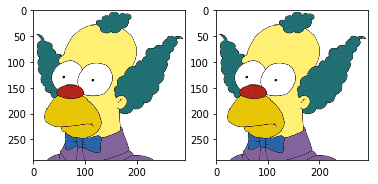

[0.0000e+00 4.2164e+04 6.0000e+00]



Processing image 102 other069.bmp


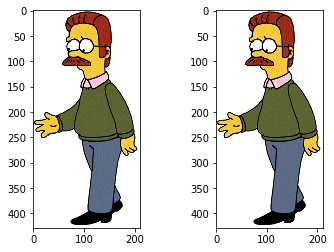

[0.0000e+00 5.4343e+04 6.0000e+00]



Processing image 103 other082.bmp


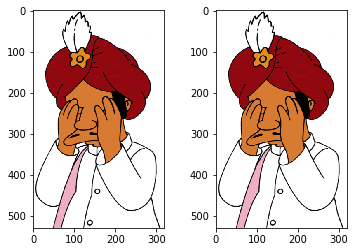

[0.00000e+00 1.03569e+05 6.00000e+00]



Processing image 104 other096.bmp


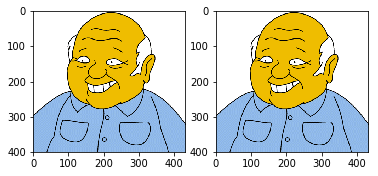

[0.0000e+00 6.3314e+04 6.0000e+00]



Processing image 105 bart061.bmp


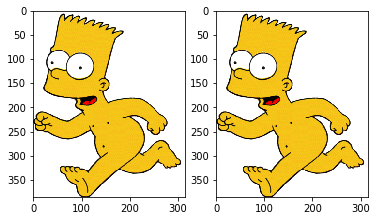

[0.0000e+00 7.2614e+04 6.0000e+00]



Processing image 106 bart075.bmp


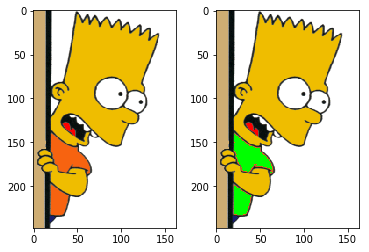

[ 1399. 19834.     0.]



Processing image 107 marge019.bmp


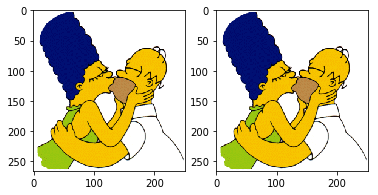

[    0. 35407.     0.]



Processing image 108 school010.bmp


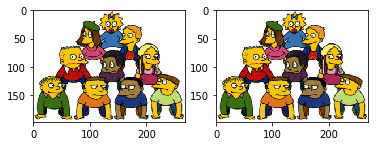

[0.0000e+00 2.4053e+04 4.0000e+00]



Processing image 109 school004.bmp


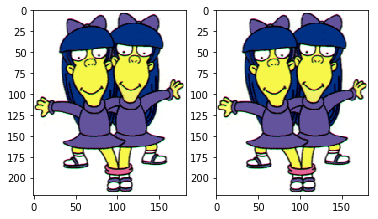

[0.0000e+00 1.7164e+04 7.0000e+00]



Processing image 110 other121.bmp


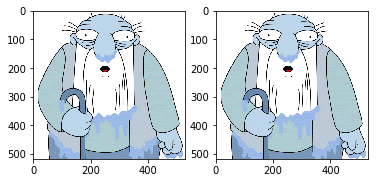

[0.00000e+00 1.21416e+05 7.00000e+00]



Processing image 111 other109.bmp


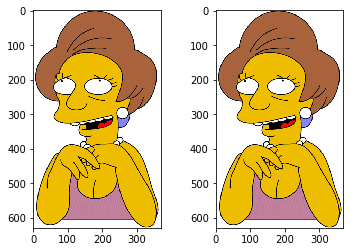

[0.0000e+00 7.9342e+04 6.0000e+00]



Processing image 112 homer032.bmp


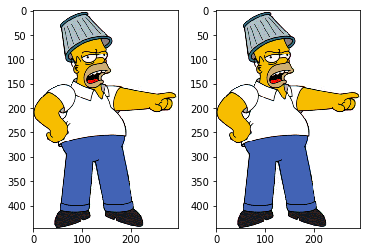

[0.0000e+00 8.4845e+04 6.0000e+00]



Processing image 113 homer026.bmp


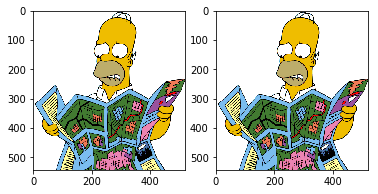

[0.00000e+00 1.52178e+05 1.00000e+00]



Processing image 114 homer027.bmp


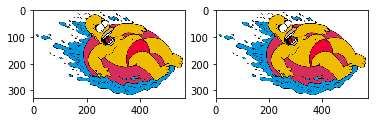

[0.0000e+00 9.6897e+04 1.0000e+00]



Processing image 115 homer033.bmp


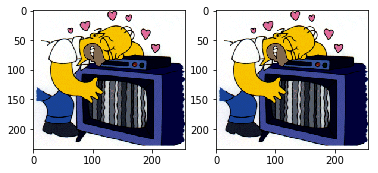

[0.0000e+00 1.3454e+04 1.0000e+00]



Processing image 116 other108.bmp


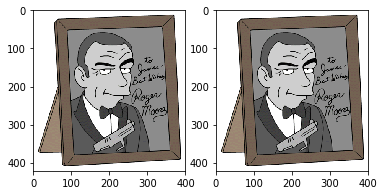

[0.000e+00 4.586e+04 1.000e+00]



Processing image 117 other120.bmp


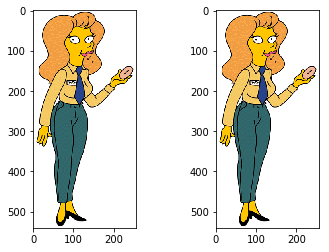

[0.0000e+00 8.3228e+04 6.0000e+00]



Processing image 118 school005.bmp


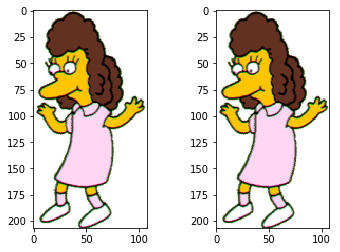

[0.0000e+00 1.1217e+04 6.0000e+00]



Processing image 119 school011.bmp


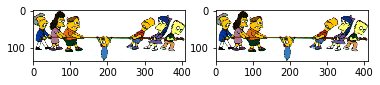

[0.000e+00 3.034e+04 7.000e+00]



Processing image 120 marge018.bmp


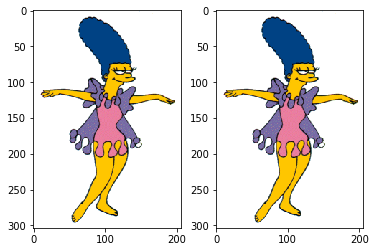

[0.0000e+00 4.6366e+04 7.0000e+00]



Processing image 121 marge024.bmp


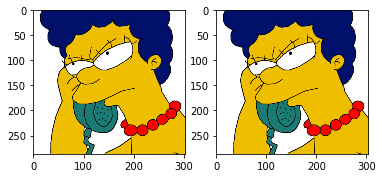

[0.0000e+00 2.3472e+04 4.0000e+00]



Processing image 122 bart048.bmp


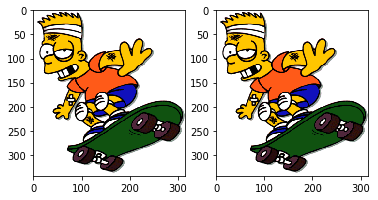

[1.0000e+00 5.9827e+04 4.0000e+00]



Processing image 123 bart074.bmp


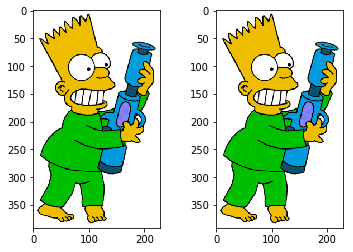

[    0. 47381.     0.]



Processing image 124 bart060.bmp


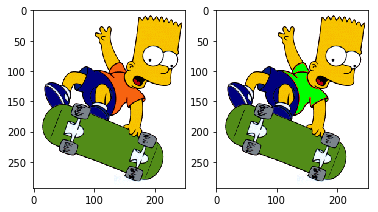

[ 1782. 40334.     0.]



Processing image 125 other097.bmp


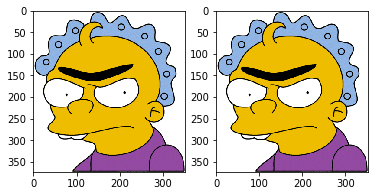

[    0. 49728.     0.]



Processing image 126 other083.bmp


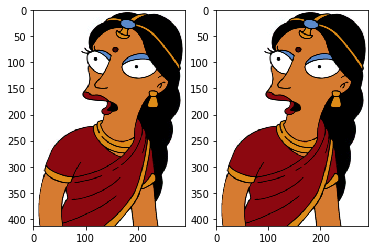

[0.0000e+00 4.4201e+04 6.0000e+00]



Processing image 127 other068.bmp


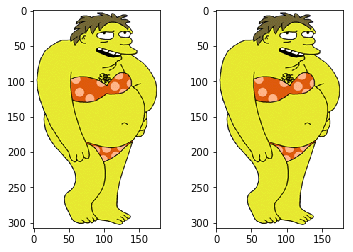

[0.0000e+00 2.2315e+04 6.0000e+00]



Processing image 128 other054.bmp


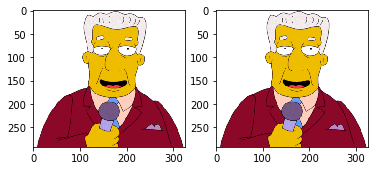

[0.0000e+00 4.5447e+04 6.0000e+00]



Processing image 129 other040.bmp


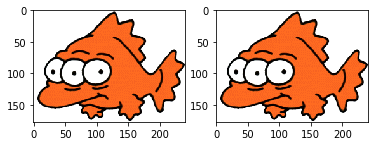

[0.000e+00 2.181e+04 6.000e+00]



Processing image 130 other056.bmp


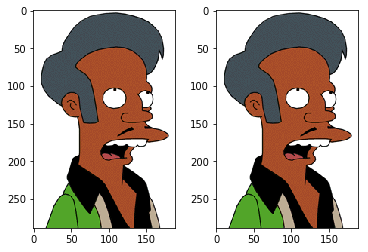

[0.000e+00 2.193e+04 6.000e+00]



Processing image 131 other042.bmp


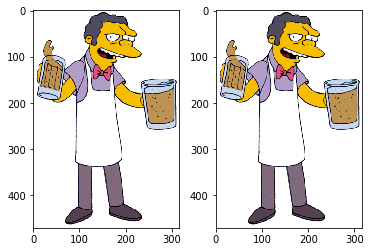

[0.0000e+00 1.0461e+05 6.0000e+00]



Processing image 132 other095.bmp


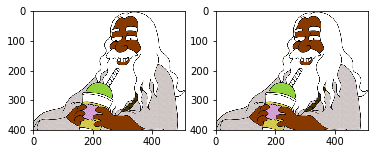

[0.00000e+00 1.35268e+05 6.00000e+00]



Processing image 133 other081.bmp


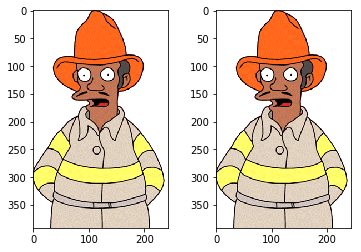

[0.0000e+00 3.8994e+04 6.0000e+00]



Processing image 134 bart076.bmp


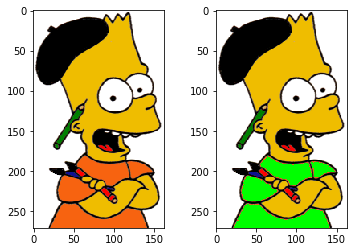

[4.6070e+03 1.6282e+04 6.0000e+00]



Processing image 135 bart062.bmp


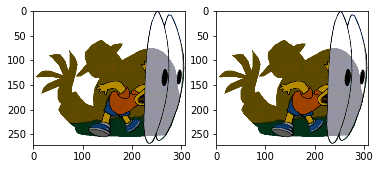

[    0. 43560.     0.]



Processing image 136 school007.bmp


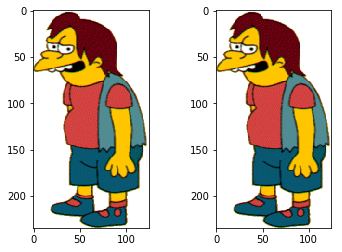

[    0. 12179.     0.]



Processing image 137 school013.bmp


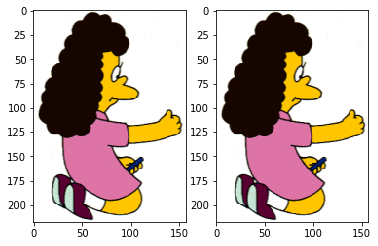

[0.0000e+00 1.7339e+04 7.0000e+00]



Processing image 138 homer019.bmp


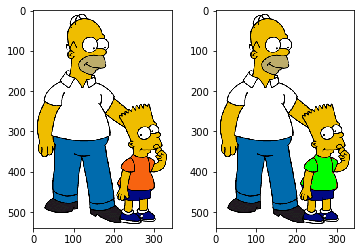

[4.65800e+03 1.17395e+05 7.00000e+00]



Processing image 139 homer025.bmp


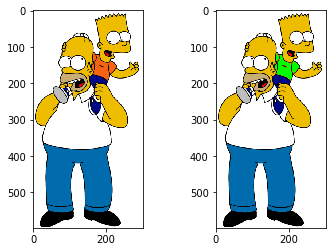

[2.24000e+03 1.07093e+05 1.00000e+00]



Processing image 140 homer031.bmp


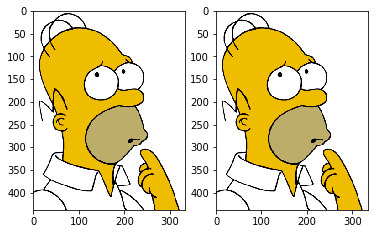

[0.0000e+00 8.5519e+04 1.0000e+00]



Processing image 141 homer030.bmp


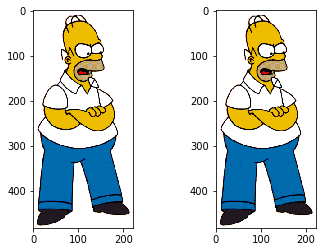

[0.0000e+00 6.2047e+04 1.0000e+00]



Processing image 142 homer024.bmp


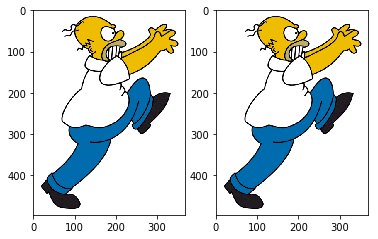

[0.00000e+00 1.36729e+05 1.00000e+00]



Processing image 143 homer018.bmp


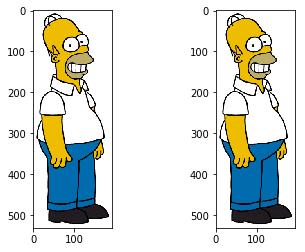

[0.0000e+00 5.8444e+04 1.0000e+00]



Processing image 144 school012.bmp


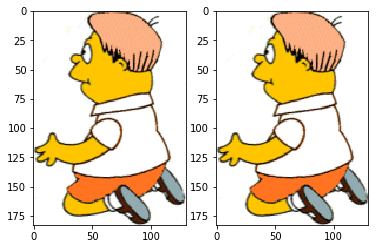

[0.0000e+00 1.3485e+04 1.0000e+00]



Processing image 145 school006.bmp


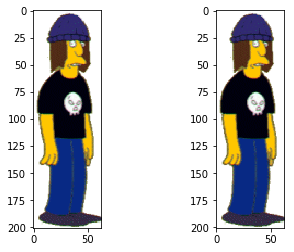

[   0. 4515.    7.]



Processing image 146 bart063.bmp


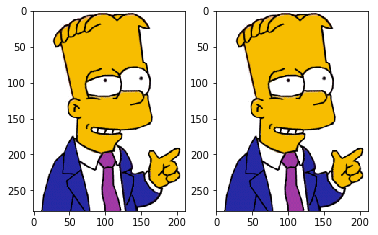

[0.0000e+00 2.9774e+04 7.0000e+00]



Processing image 147 bart077.bmp


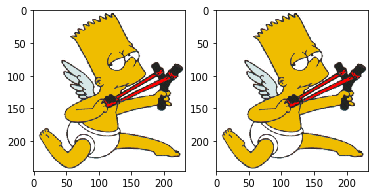

[    0. 33704.     0.]



Processing image 148 other080.bmp


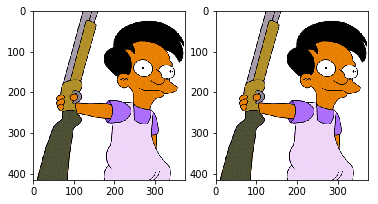

[    0. 80385.     0.]



Processing image 149 other094.bmp


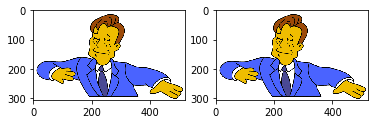

[0.00000e+00 1.03878e+05 6.00000e+00]



Processing image 150 other043.bmp


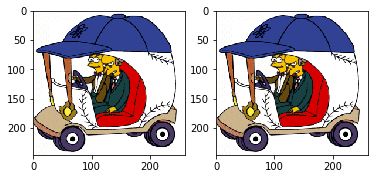

[0.0000e+00 2.8041e+04 6.0000e+00]



Processing image 151 other057.bmp


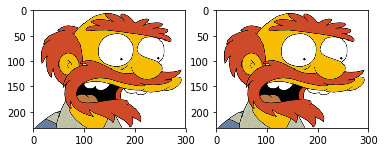

[0.0000e+00 3.1323e+04 6.0000e+00]



Processing image 152 other053.bmp


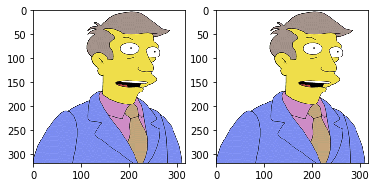

[0.0000e+00 4.7553e+04 6.0000e+00]



Processing image 153 other047.bmp


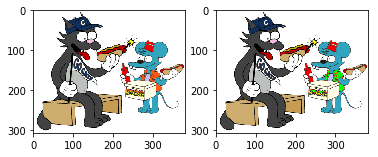

[6.4200e+02 7.2434e+04 6.0000e+00]



Processing image 154 other090.bmp


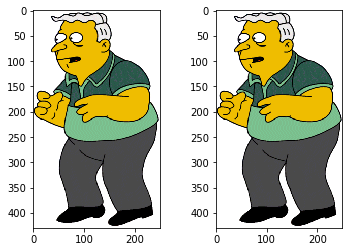

[0.0000e+00 4.0797e+04 6.0000e+00]



Processing image 155 other084.bmp


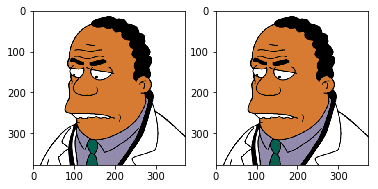

[0.0000e+00 7.6199e+04 6.0000e+00]



Processing image 156 bart073.bmp


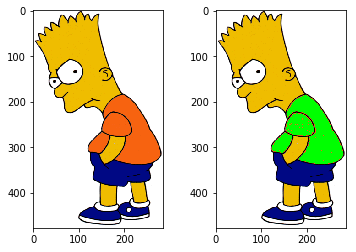

[1.1585e+04 8.1088e+04 6.0000e+00]



Processing image 157 bart067.bmp


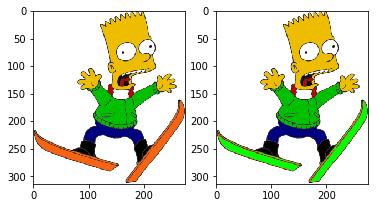

[ 3604. 59788.     0.]



Processing image 158 marge023.bmp


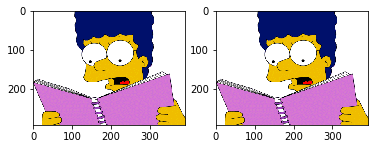

[    0. 50117.     0.]



Processing image 159 school002.bmp


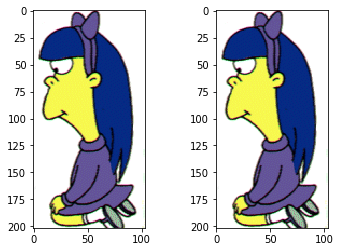

[0.000e+00 8.205e+03 4.000e+00]



Processing image 160 school016.bmp


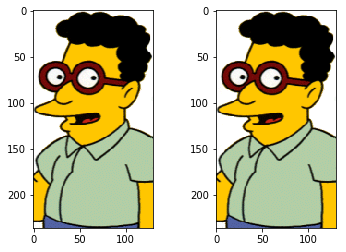

[   0. 5174.    7.]



Processing image 161 homer020.bmp


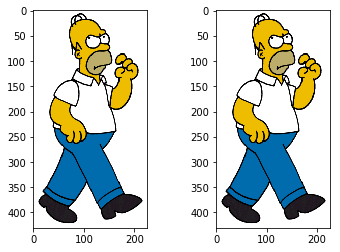

[0.0000e+00 6.1005e+04 7.0000e+00]



Processing image 162 homer034.bmp


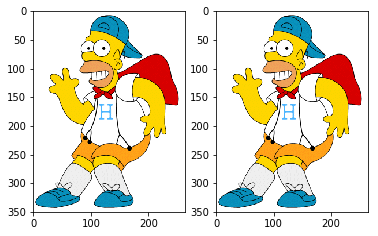

[0.0000e+00 5.8806e+04 1.0000e+00]



Processing image 163 homer008.bmp


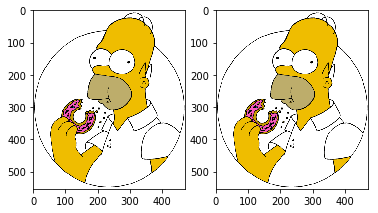

[0.00000e+00 1.88241e+05 1.00000e+00]



Processing image 164 homer009.bmp


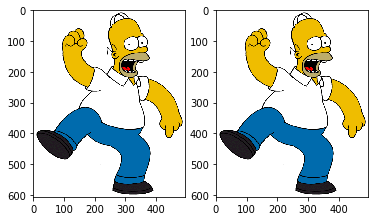

[0.00000e+00 2.11059e+05 1.00000e+00]



Processing image 165 homer035.bmp


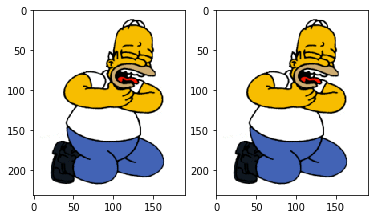

[0.0000e+00 2.8486e+04 1.0000e+00]



Processing image 166 homer021.bmp


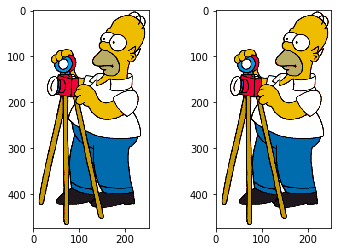

[0.0000e+00 6.8443e+04 1.0000e+00]



Processing image 167 school017.bmp


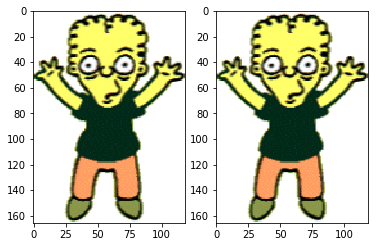

[0.000e+00 9.969e+03 1.000e+00]



Processing image 168 school003.bmp


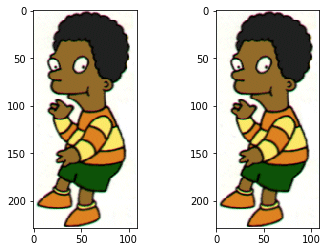

[   0. 4774.    7.]



Processing image 169 marge022.bmp


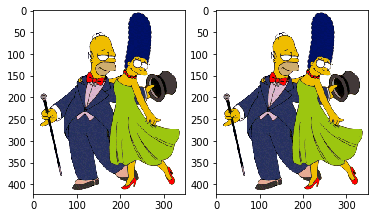

[0.0000e+00 7.9848e+04 7.0000e+00]



Processing image 170 bart066.bmp


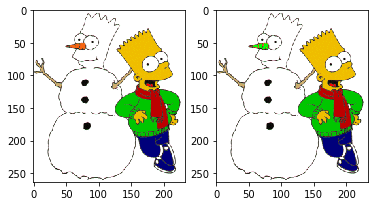

[1.1000e+02 4.6021e+04 4.0000e+00]



Processing image 171 bart072.bmp


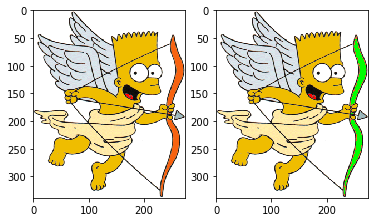

[ 1882. 48351.     0.]



Processing image 172 other085.bmp


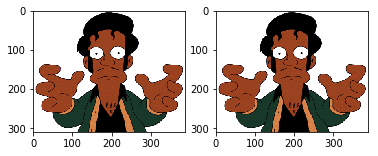

[    0. 57580.     0.]



Processing image 173 other091.bmp


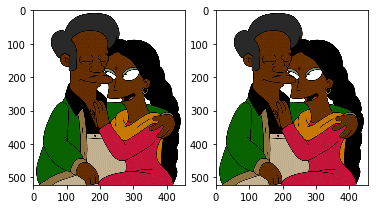

[0.0000e+00 7.3006e+04 6.0000e+00]



Processing image 174 other046.bmp


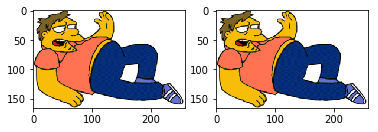

[0.0000e+00 1.8052e+04 6.0000e+00]



Processing image 175 other052.bmp


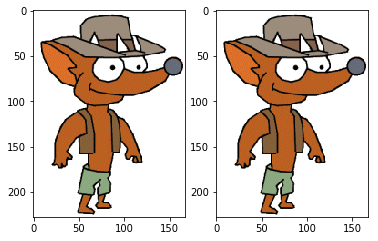

[0.0000e+00 2.3436e+04 6.0000e+00]



Processing image 176 other078.bmp


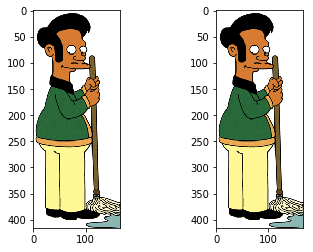

[0.0000e+00 3.1621e+04 6.0000e+00]



Processing image 177 other044.bmp


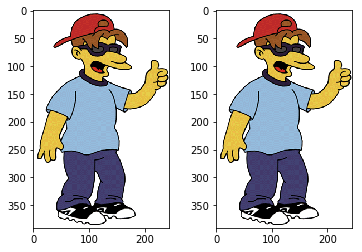

[0.0000e+00 5.2427e+04 6.0000e+00]



Processing image 178 other050.bmp


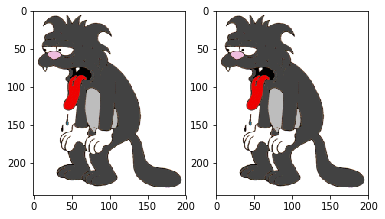

[0.00e+00 3.02e+04 6.00e+00]



Processing image 179 other087.bmp


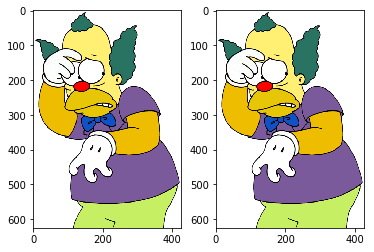

[0.00000e+00 1.19601e+05 6.00000e+00]



Processing image 180 other093.bmp


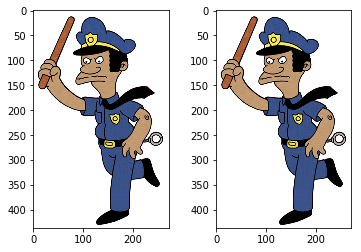

[0.0000e+00 7.7835e+04 6.0000e+00]



Processing image 181 bart064.bmp


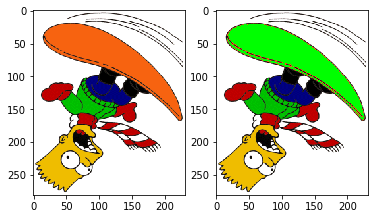

[8.4520e+03 3.8229e+04 6.0000e+00]



Processing image 182 bart070.bmp


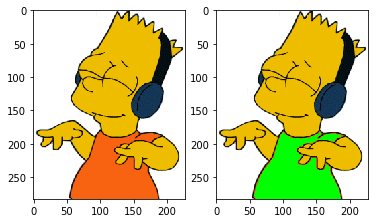

[ 7823. 29284.     0.]



Processing image 183 marge008.bmp


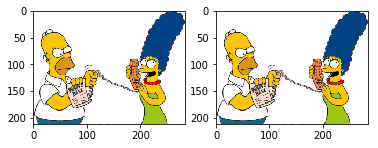

[    0. 39738.     0.]



Processing image 184 marge020.bmp


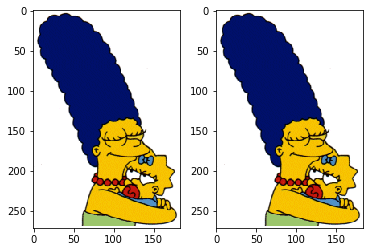

[0.0000e+00 2.6265e+04 4.0000e+00]



Processing image 185 school015.bmp


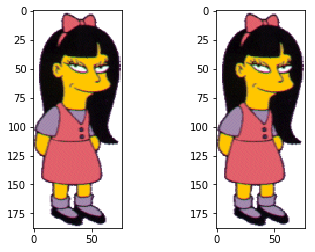

[0.000e+00 4.578e+03 4.000e+00]



Processing image 186 school001.bmp


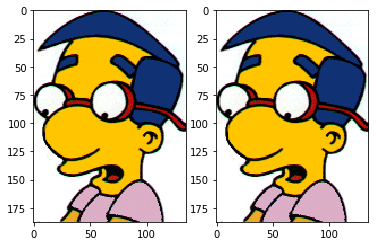

[   0. 5988.    7.]



Processing image 187 school029.bmp


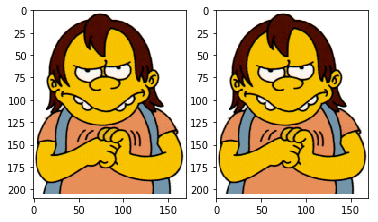

[0.0000e+00 1.0091e+04 7.0000e+00]



Processing image 188 other118.bmp


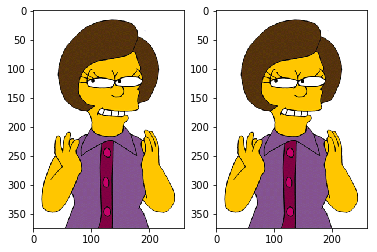

[0.000e+00 4.361e+04 7.000e+00]



Processing image 189 homer037.bmp


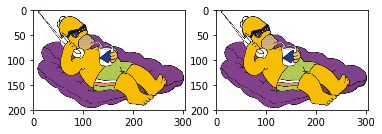

[0.0000e+00 2.7743e+04 6.0000e+00]



Processing image 190 homer023.bmp


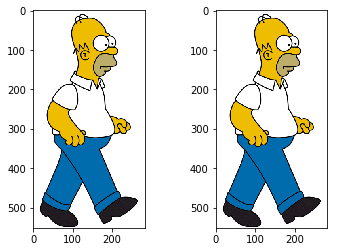

[0.00000e+00 1.01992e+05 1.00000e+00]



Processing image 191 homer022.bmp


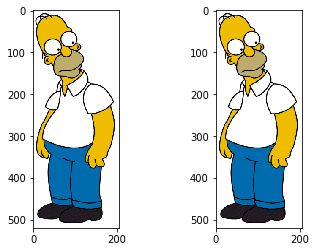

[0.0000e+00 6.2999e+04 1.0000e+00]



Processing image 192 homer036.bmp


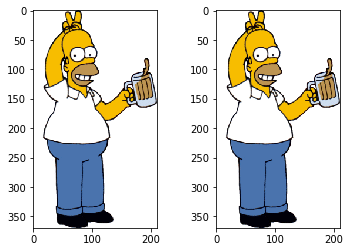

[0.000e+00 5.165e+04 1.000e+00]



Processing image 193 other119.bmp


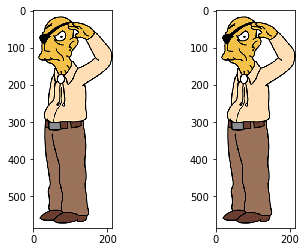

[0.0000e+00 6.1597e+04 1.0000e+00]



Processing image 194 school028.bmp


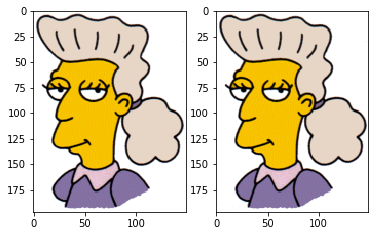

[0.0000e+00 1.1224e+04 6.0000e+00]



Processing image 195 school014.bmp


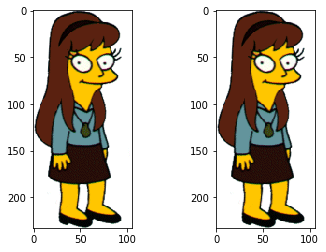

[0.00e+00 9.68e+03 7.00e+00]



Processing image 196 marge021.bmp


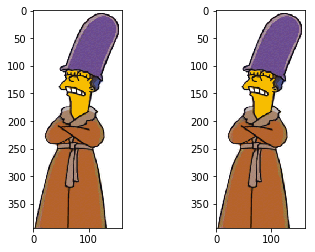

[0.0000e+00 2.9646e+04 7.0000e+00]



Processing image 197 marge009.bmp


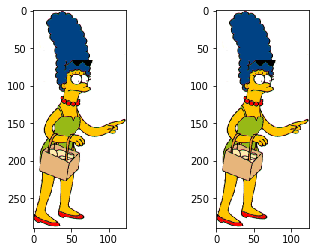

[0.000e+00 2.296e+04 4.000e+00]



Processing image 198 bart071.bmp


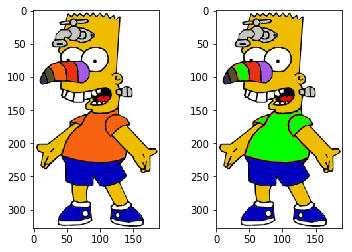

[5.0420e+03 3.2541e+04 4.0000e+00]



Processing image 199 bart065.bmp


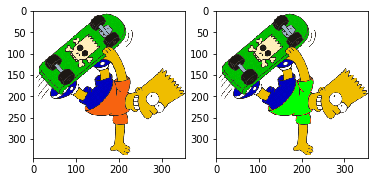

[ 4526. 80315.     0.]



Processing image 200 bart059.bmp


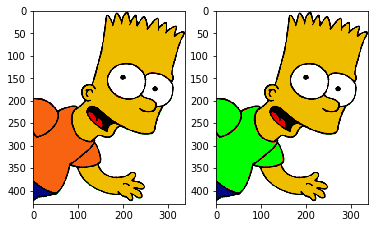

[17349. 78939.     0.]



Processing image 201 other092.bmp


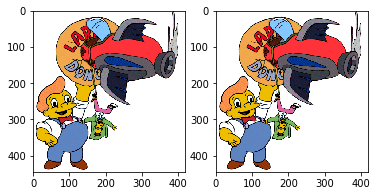

[     0. 103493.      0.]



Processing image 202 other086.bmp


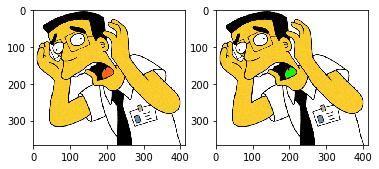

[5.2800e+02 8.3776e+04 6.0000e+00]



Processing image 203 other051.bmp


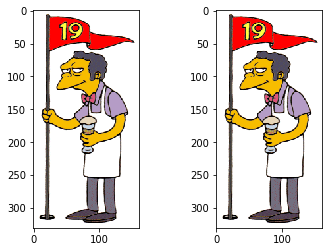

[0.0000e+00 3.3898e+04 6.0000e+00]



Processing image 204 other045.bmp


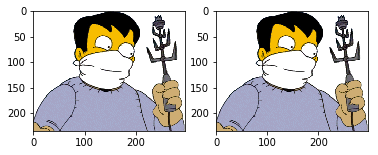

[0.0000e+00 3.3257e+04 6.0000e+00]



Processing image 205 other079.bmp


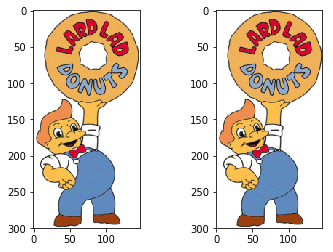

[0.0000e+00 1.9308e+04 6.0000e+00]



Processing image 206 other060.bmp


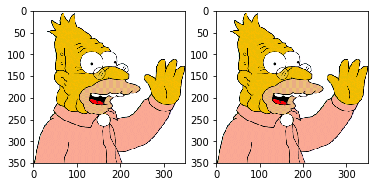

[0.0000e+00 6.0365e+04 6.0000e+00]



Processing image 207 other074.bmp


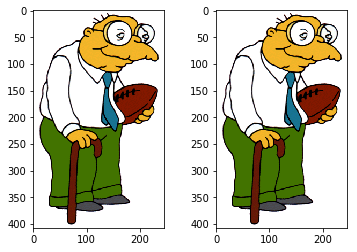

[0.0000e+00 5.7368e+04 6.0000e+00]



Processing image 208 other048.bmp


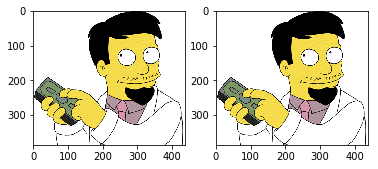

[0.00000e+00 1.03048e+05 6.00000e+00]



Processing image 209 bart040.bmp


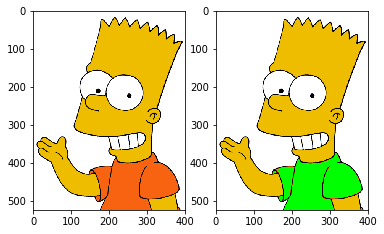

[2.13370e+04 1.14233e+05 6.00000e+00]



Processing image 210 bart054.bmp


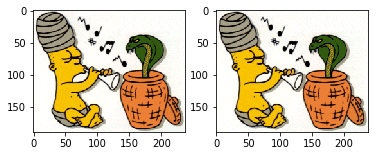

[   0. 5659.    0.]



Processing image 211 bart068.bmp


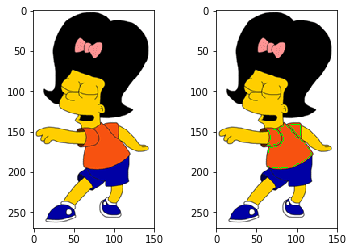

[  219. 19675.     0.]



Processing image 212 marge010.bmp


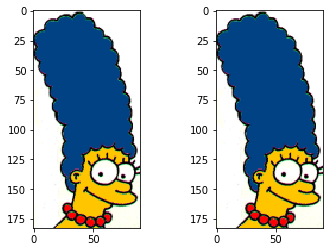

[   0. 4480.    0.]



Processing image 213 marge004.bmp


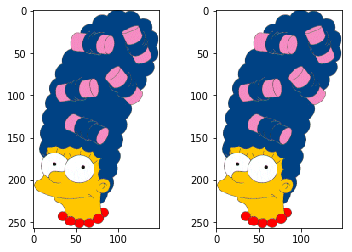

[0.0000e+00 1.5971e+04 4.0000e+00]



Processing image 214 school019.bmp


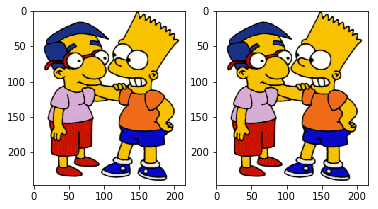

[0.0000e+00 2.3804e+04 4.0000e+00]



Processing image 215 school031.bmp


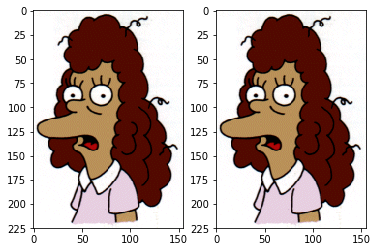

[0.000e+00 9.831e+03 7.000e+00]



Processing image 216 school025.bmp


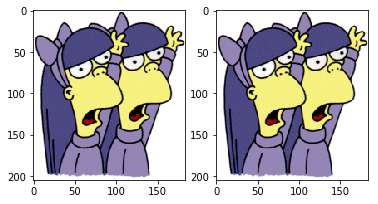

[0.000e+00 1.082e+04 7.000e+00]



Processing image 217 other114.bmp


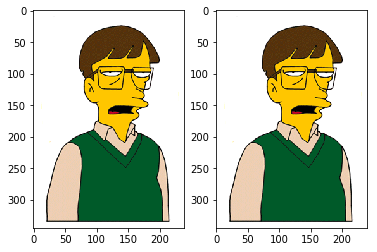

[0.0000e+00 4.2241e+04 7.0000e+00]



Processing image 218 other100.bmp


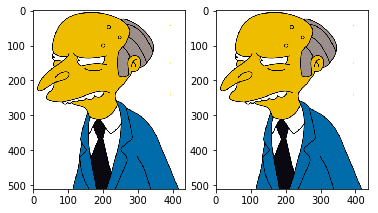

[0.00000e+00 1.14387e+05 6.00000e+00]



Processing image 219 homer013.bmp


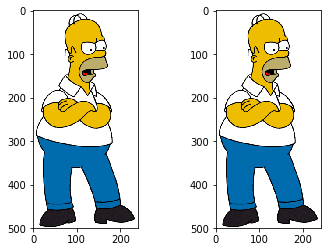

[0.0000e+00 7.2866e+04 6.0000e+00]



Processing image 220 homer007.bmp


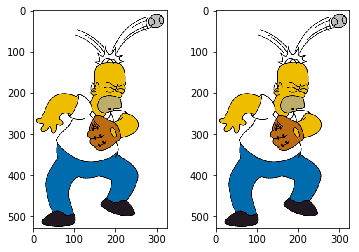

[0.00000e+00 1.21592e+05 1.00000e+00]



Processing image 221 homer006.bmp


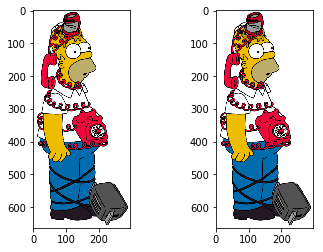

[0.000e+00 1.098e+05 1.000e+00]



Processing image 222 homer012.bmp


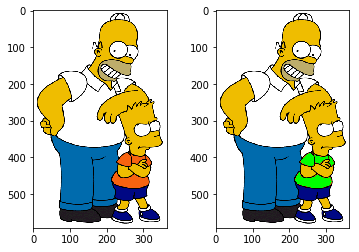

[4.04600e+03 1.21718e+05 1.00000e+00]



Processing image 223 other101.bmp


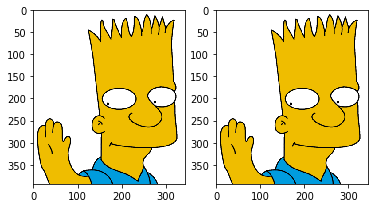

[0.000e+00 6.848e+04 1.000e+00]



Processing image 224 other115.bmp


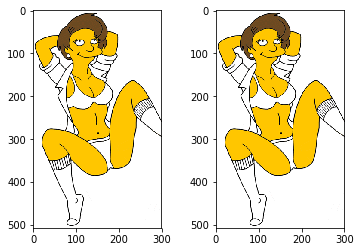

[0.0000e+00 9.9578e+04 6.0000e+00]



Processing image 225 school024.bmp


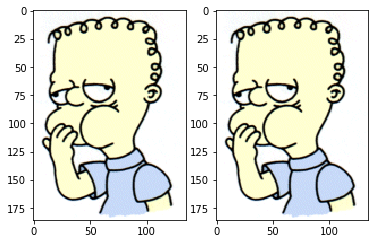

[0.000e+00 8.225e+03 6.000e+00]



Processing image 226 school030.bmp


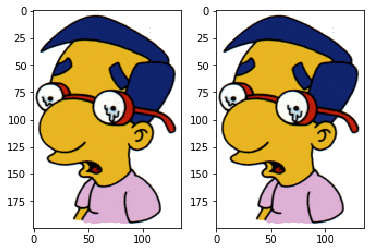

[0.000e+00 1.008e+04 7.000e+00]



Processing image 227 school018.bmp


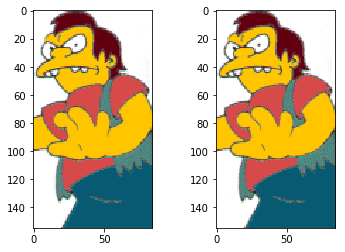

[   0. 2997.    7.]



Processing image 228 marge005.bmp


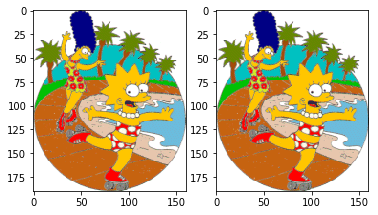

[0.000e+00 8.263e+03 7.000e+00]



Processing image 229 marge011.bmp


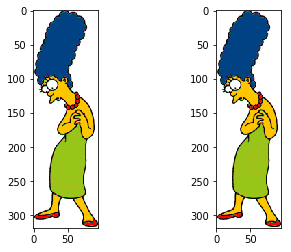

[0.0000e+00 1.4903e+04 4.0000e+00]



Processing image 230 bart069.bmp


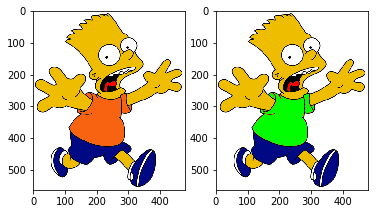

[1.97250e+04 1.60516e+05 4.00000e+00]



Processing image 231 bart055.bmp


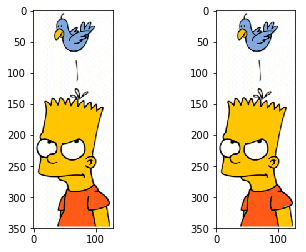

[   29. 15374.     0.]



Processing image 232 bart041.bmp


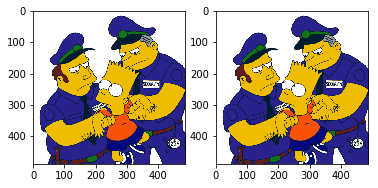

[    0. 77421.     0.]



Processing image 233 other049.bmp


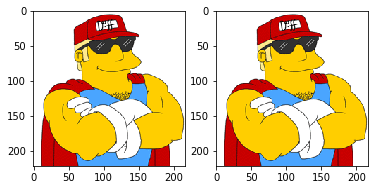

[    0. 20949.     0.]



Processing image 234 other075.bmp


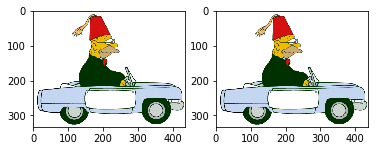

[0.0000e+00 9.7034e+04 6.0000e+00]



Processing image 235 other061.bmp


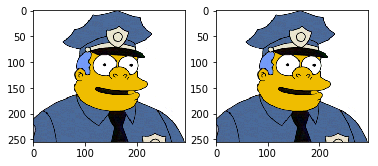

[0.0000e+00 3.5044e+04 6.0000e+00]



Processing image 236 other077.bmp


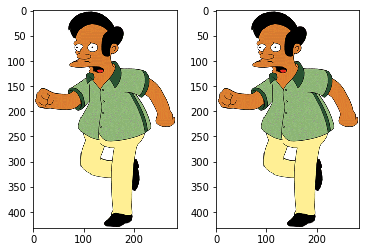

[0.0000e+00 7.7207e+04 6.0000e+00]



Processing image 237 other063.bmp


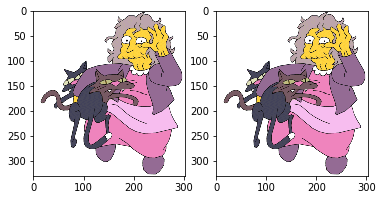

[0.0000e+00 5.1675e+04 6.0000e+00]



Processing image 238 other088.bmp


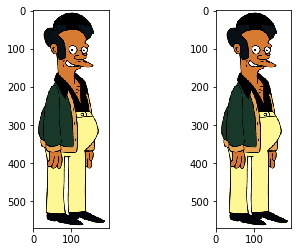

[0.0000e+00 5.2845e+04 6.0000e+00]



Processing image 239 bart080.bmp


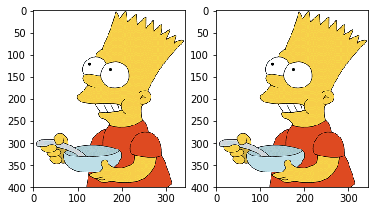

[0.0000e+00 7.9125e+04 6.0000e+00]



Processing image 240 bart057.bmp


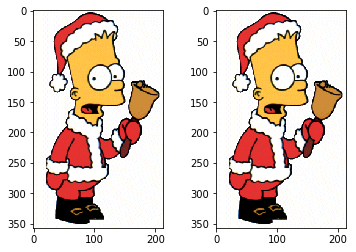

[    0. 29815.     0.]



Processing image 241 bart043.bmp


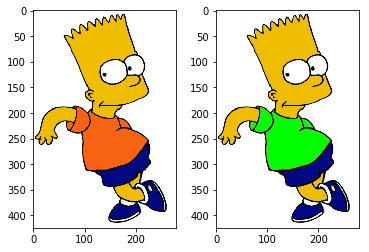

[10314. 75122.     0.]



Processing image 242 marge007.bmp


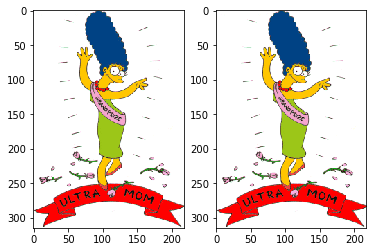

[    0. 49751.     0.]



Processing image 243 marge013.bmp


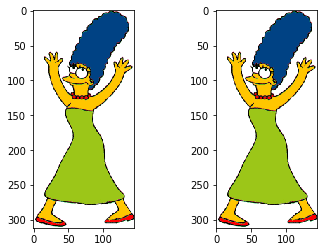

[0.0000e+00 2.4959e+04 4.0000e+00]



Processing image 244 school026.bmp


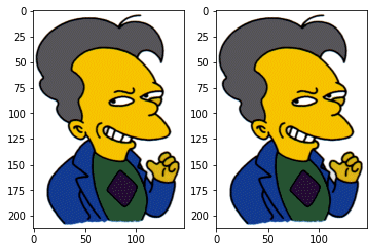

[0.000e+00 9.967e+03 4.000e+00]



Processing image 245 school032.bmp


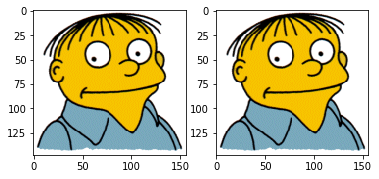

[0.000e+00 8.114e+03 7.000e+00]



Processing image 246 other103.bmp


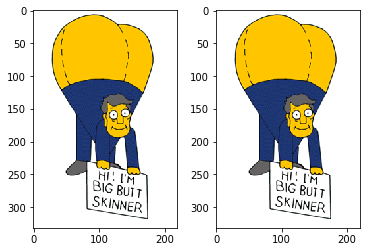

[0.0000e+00 4.4396e+04 7.0000e+00]



Processing image 247 other117.bmp


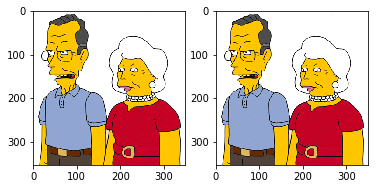

[0.0000e+00 5.3586e+04 6.0000e+00]



Processing image 248 homer038.bmp


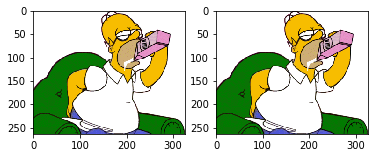

[0.0000e+00 4.8305e+04 6.0000e+00]



Processing image 249 homer004.bmp


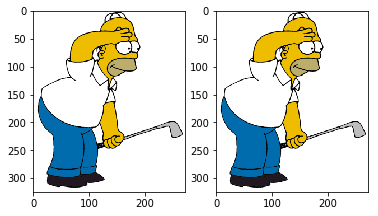

[0.000e+00 6.492e+04 1.000e+00]



Processing image 250 homer011.bmp


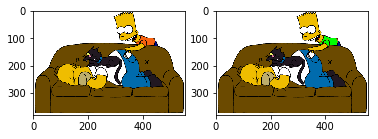

[1.2300e+03 8.5007e+04 1.0000e+00]



Processing image 251 homer005.bmp


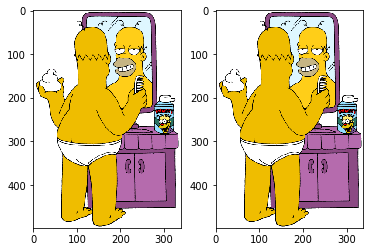

[0.000e+00 6.524e+04 1.000e+00]



Processing image 252 homer039.bmp


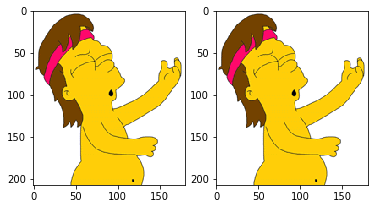

[0.0000e+00 1.9988e+04 1.0000e+00]



Processing image 253 other116.bmp


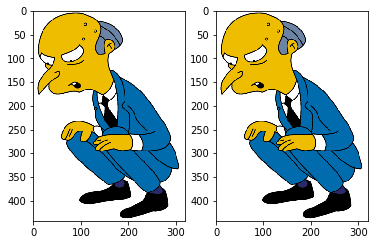

[0.0000e+00 7.8253e+04 1.0000e+00]



Processing image 254 other102.bmp


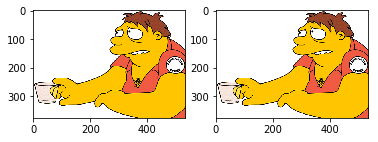

[0.0000e+00 9.7355e+04 6.0000e+00]



Processing image 255 school033.bmp


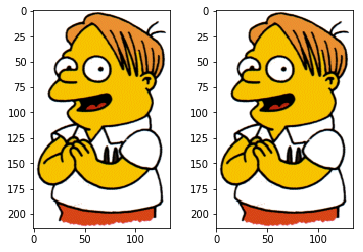

[0.0000e+00 1.2718e+04 6.0000e+00]



Processing image 256 school027.bmp


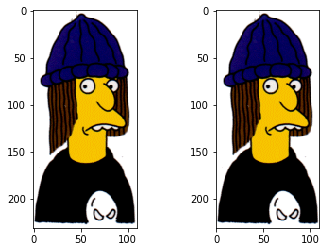

[0.000e+00 7.761e+03 7.000e+00]



Processing image 257 marge012.bmp


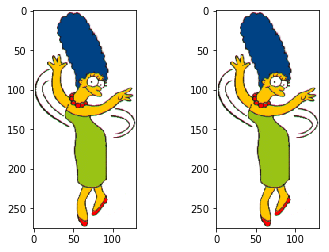

[0.0000e+00 2.2852e+04 7.0000e+00]



Processing image 258 marge006.bmp


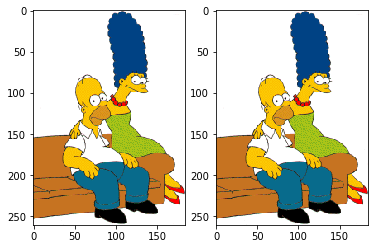

[0.0000e+00 2.5656e+04 4.0000e+00]



Processing image 259 bart042.bmp


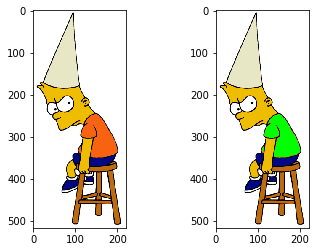

[5.0760e+03 7.7316e+04 4.0000e+00]



Processing image 260 bart056.bmp


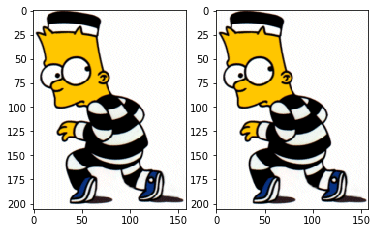

[    0. 11109.     0.]



Processing image 261 other089.bmp


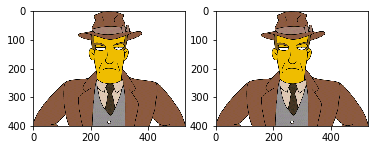

[     0. 112284.      0.]



Processing image 262 other062.bmp


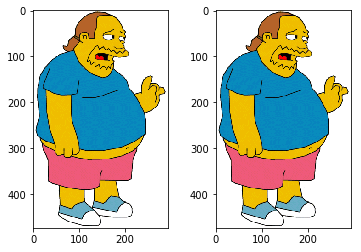

[0.0000e+00 6.1316e+04 6.0000e+00]



Processing image 263 other076.bmp


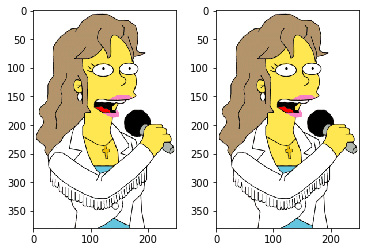

[0.0000e+00 5.5183e+04 6.0000e+00]



Processing image 264 other072.bmp


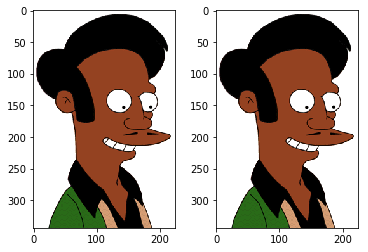

[0.0000e+00 3.1841e+04 6.0000e+00]



Processing image 265 other066.bmp


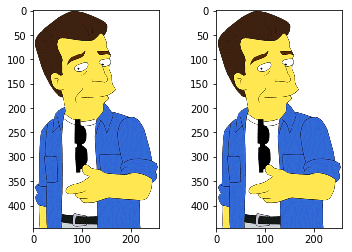

[0.0000e+00 4.6965e+04 6.0000e+00]



Processing image 266 other099.bmp


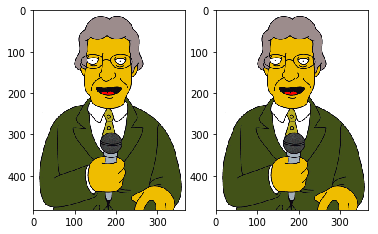

[0.0000e+00 7.9036e+04 6.0000e+00]



Processing image 267 bart052.bmp


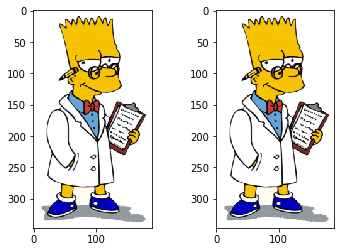

[0.0000e+00 4.2389e+04 6.0000e+00]



Processing image 268 bart046.bmp


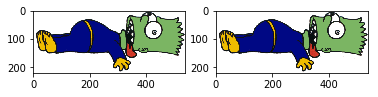

[    0. 63774.     0.]



Processing image 269 marge002.bmp


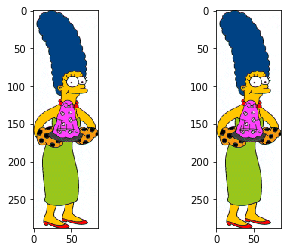

[   0. 9118.    0.]



Processing image 270 marge016.bmp


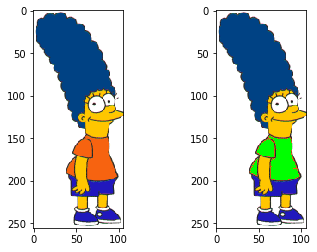

[1.5590e+03 1.4258e+04 4.0000e+00]



Processing image 271 school023.bmp


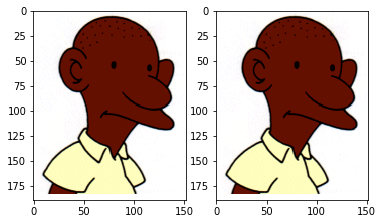

[0.000e+00 1.043e+04 4.000e+00]



Processing image 272 other106.bmp


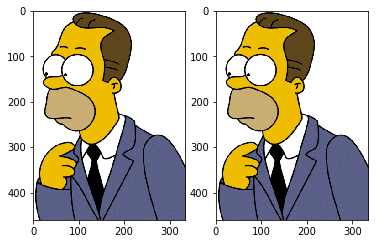

[0.0000e+00 6.2712e+04 7.0000e+00]



Processing image 273 other112.bmp


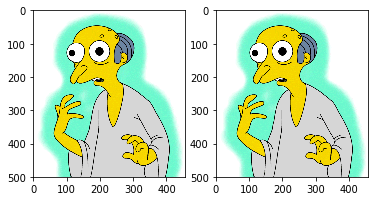

[0.000e+00 7.065e+04 6.000e+00]



Processing image 274 homer001.bmp


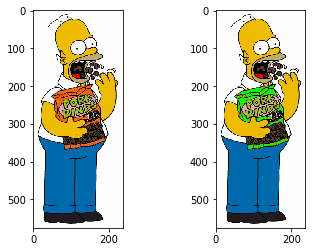

[3.3960e+03 6.5774e+04 6.0000e+00]



Processing image 275 homer015.bmp


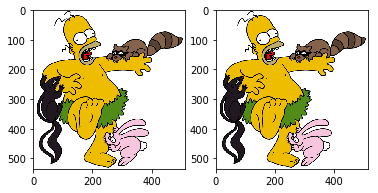

[0.00000e+00 1.58073e+05 1.00000e+00]



Processing image 276 homer029.bmp


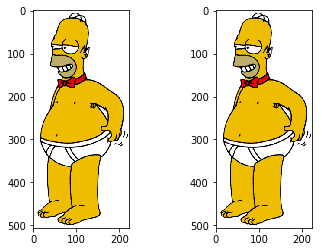

[0.0000e+00 6.0312e+04 1.0000e+00]



Processing image 277 homer028.bmp


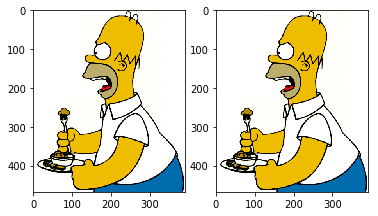

[0.0000e+00 9.7848e+04 1.0000e+00]



Processing image 278 homer014.bmp


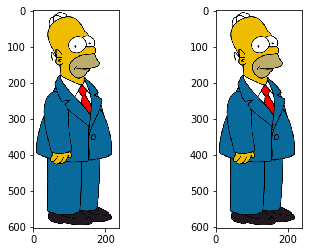

[0.0000e+00 6.5606e+04 1.0000e+00]



Processing image 279 other113.bmp


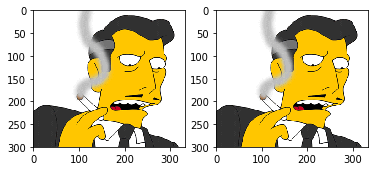

[0.0000e+00 4.6914e+04 1.0000e+00]



Processing image 280 other107.bmp


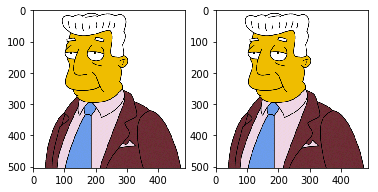

[0.00000e+00 1.29893e+05 6.00000e+00]



Processing image 281 school022.bmp


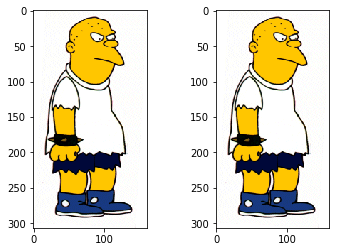

[0.0000e+00 2.1572e+04 6.0000e+00]



Processing image 282 marge017.bmp


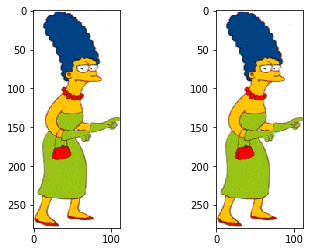

[0.0000e+00 1.7298e+04 7.0000e+00]



Processing image 283 marge003.bmp


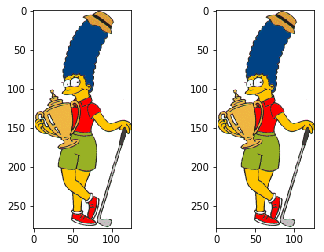

[0.0000e+00 2.1352e+04 4.0000e+00]



Processing image 284 bart047.bmp


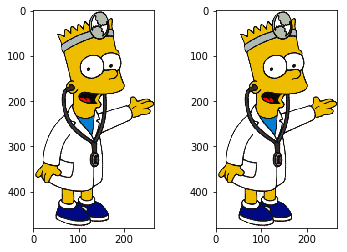

[0.0000e+00 9.2421e+04 4.0000e+00]



Processing image 285 bart053.bmp


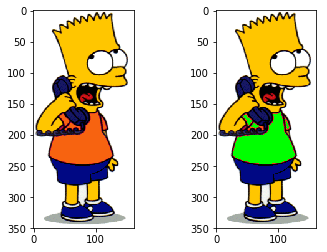

[ 4755. 25893.     0.]



Processing image 286 other098.bmp


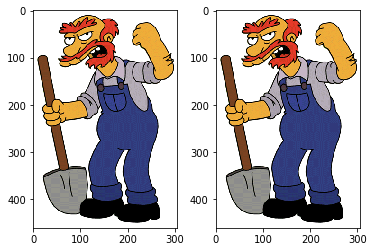

[    0. 64145.     0.]



Processing image 287 other067.bmp


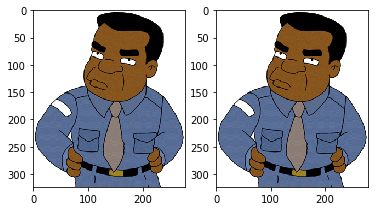

[0.000e+00 3.432e+04 6.000e+00]



Processing image 288 other073.bmp


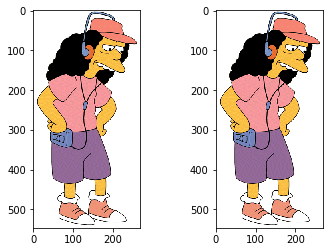

[0.0000e+00 7.7412e+04 6.0000e+00]



Processing image 289 other059.bmp


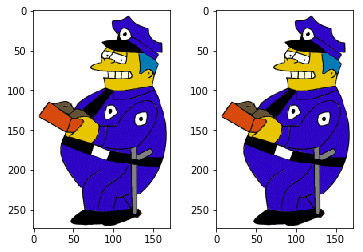

[0.0000e+00 2.3287e+04 6.0000e+00]



Processing image 290 other065.bmp


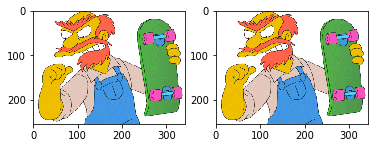

[0.0000e+00 3.1694e+04 6.0000e+00]



Processing image 291 other071.bmp


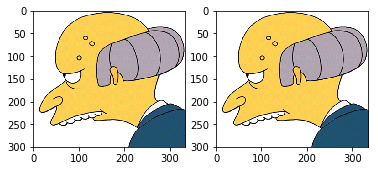

[0.0000e+00 3.6573e+04 6.0000e+00]



Processing image 292 bart079.bmp


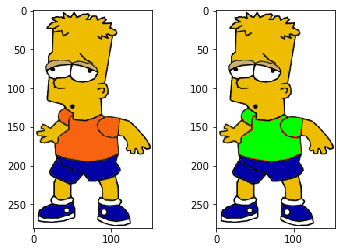

[3.5610e+03 2.2132e+04 6.0000e+00]



Processing image 293 bart045.bmp


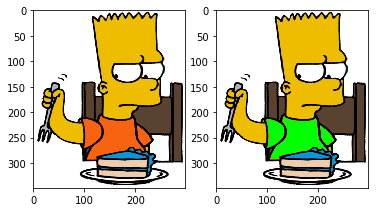

[ 6514. 48240.     0.]



Processing image 294 bart051.bmp


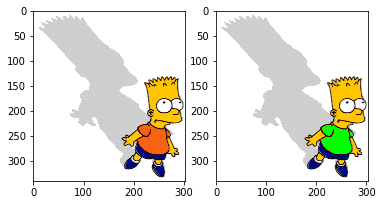

[ 2577. 65780.     0.]



Processing image 295 marge015.bmp


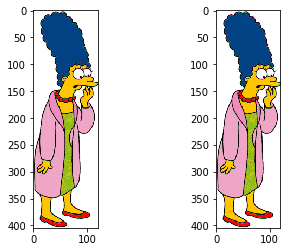

[    0. 19280.     0.]



Processing image 296 marge001.bmp


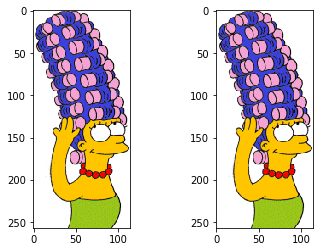

[0.0000e+00 1.1265e+04 4.0000e+00]



Processing image 297 school034.bmp


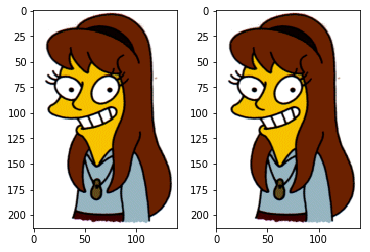

[0.0000e+00 1.2026e+04 4.0000e+00]



Processing image 298 school020.bmp


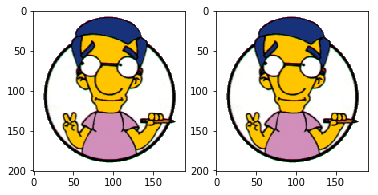

[0.0000e+00 2.0876e+04 7.0000e+00]



Processing image 299 school008.bmp


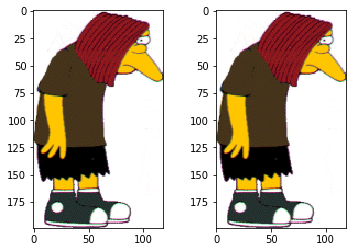

[0.0000e+00 1.0155e+04 7.0000e+00]



Processing image 300 other111.bmp


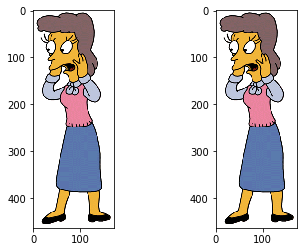

[0.000e+00 4.281e+04 7.000e+00]



Processing image 301 other105.bmp


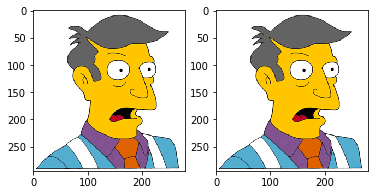

[0.0000e+00 4.4115e+04 6.0000e+00]



Processing image 302 homer016.bmp


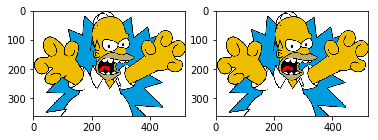

[0.0000e+00 9.2755e+04 6.0000e+00]



Processing image 303 homer002.bmp


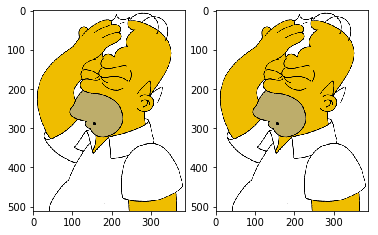

[0.00000e+00 1.15967e+05 1.00000e+00]



Processing image 304 homer003.bmp


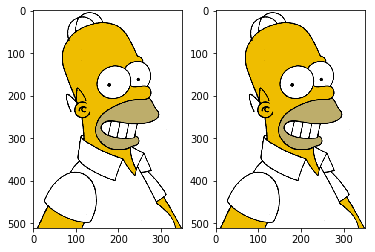

[0.00000e+00 1.28036e+05 1.00000e+00]



Processing image 305 homer017.bmp


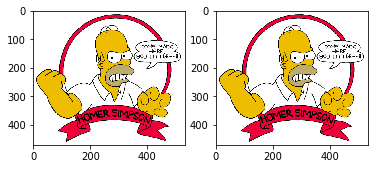

[0.00000e+00 1.68882e+05 1.00000e+00]



Processing image 306 other104.bmp


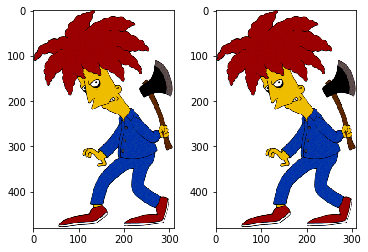

[0.0000e+00 8.7765e+04 1.0000e+00]



Processing image 307 other110.bmp


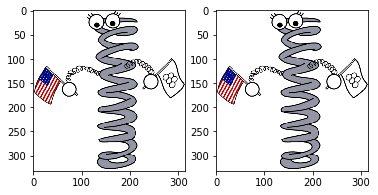

[0.0000e+00 8.1581e+04 6.0000e+00]



Processing image 308 school009.bmp


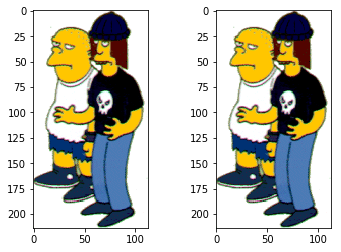

[0.00e+00 9.67e+03 6.00e+00]



Processing image 309 school021.bmp


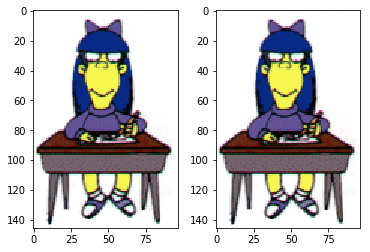

[   0. 6497.    7.]



Processing image 310 school035.bmp


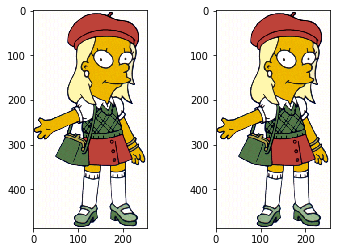

[0.0000e+00 3.7161e+04 7.0000e+00]



Processing image 311 marge014.bmp


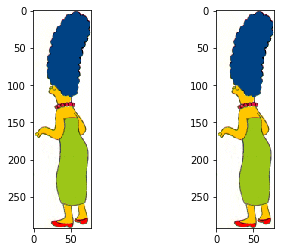

[0.000e+00 7.961e+03 7.000e+00]



Processing image 312 bart050.bmp


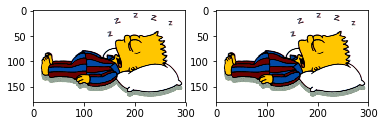

[0.0000e+00 3.5633e+04 4.0000e+00]



Processing image 313 bart044.bmp


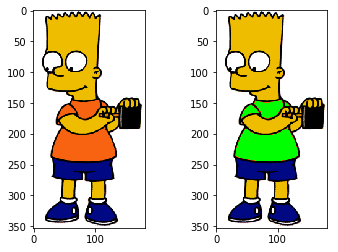

[ 5184. 33574.     0.]



Processing image 314 bart078.bmp


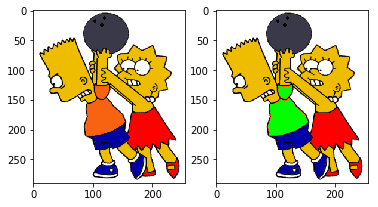

[ 3152. 39517.     0.]



Processing image 315 other070.bmp


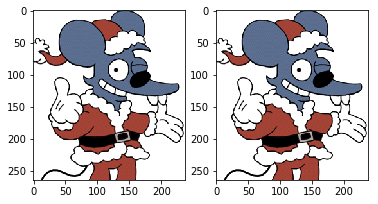

[    0. 37388.     0.]



Processing image 316 other064.bmp


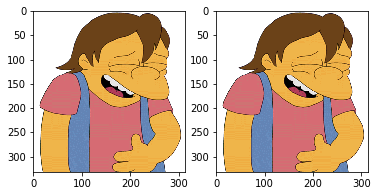

[0.0000e+00 2.7457e+04 6.0000e+00]



Processing image 317 other058.bmp


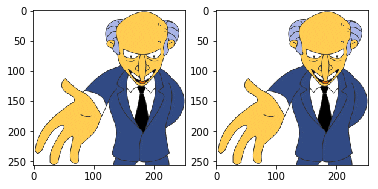

[0.0000e+00 3.2392e+04 6.0000e+00]



Processing image 318 other003.bmp


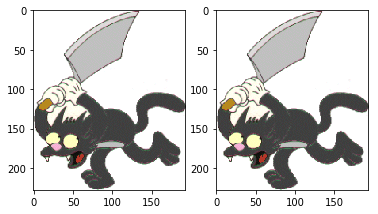

[0.0000e+00 2.5299e+04 6.0000e+00]



Processing image 319 maggie006.bmp


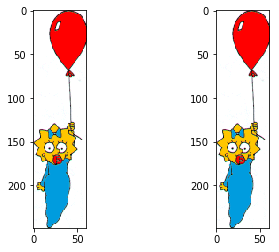

[0.00e+00 8.61e+03 6.00e+00]



Processing image 320 maggie012.bmp


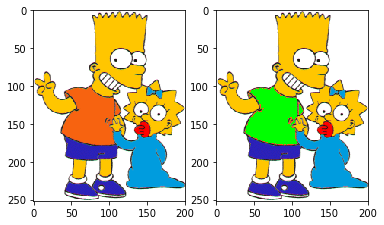

[3.7060e+03 2.5627e+04 3.0000e+00]



Processing image 321 other017.bmp


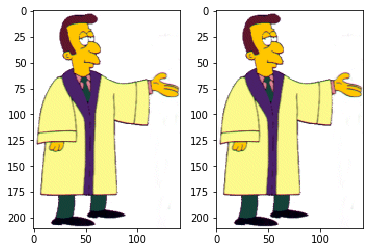

[0.0000e+00 1.6045e+04 3.0000e+00]



Processing image 322 bart023.bmp


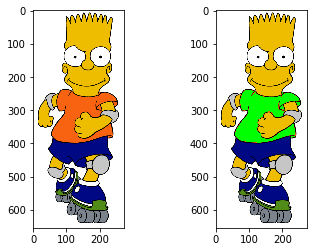

[1.5032e+04 8.8777e+04 6.0000e+00]



Processing image 323 bart037.bmp


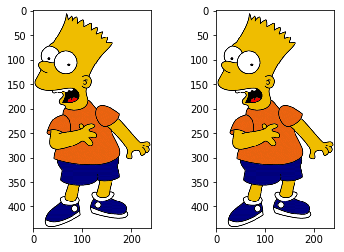

[    0. 62493.     0.]



Processing image 324 lisa014.bmp


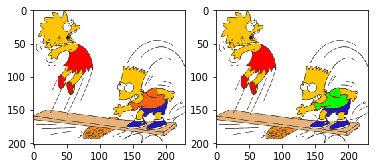

[  721. 30939.     0.]



Processing image 325 lisa028.bmp


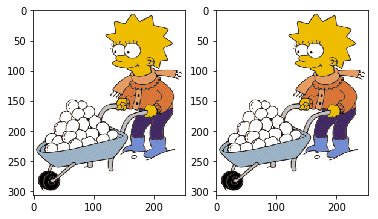

[0.0000e+00 5.1678e+04 2.0000e+00]



Processing image 326 family022.bmp


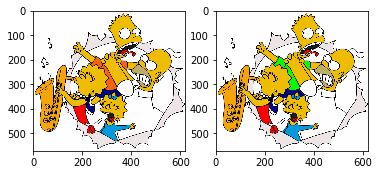

[3.69000e+03 2.11391e+05 2.00000e+00]



Processing image 327 homer058.bmp


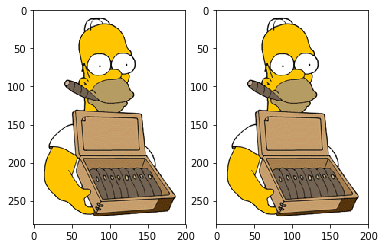

[0.0000e+00 3.2557e+04 5.0000e+00]



Processing image 328 homer059.bmp


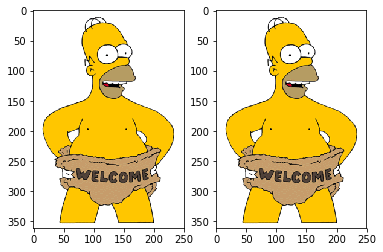

[0.0000e+00 4.8648e+04 1.0000e+00]



Processing image 329 family023.bmp


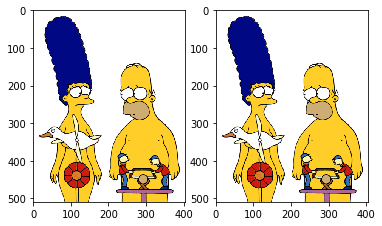

[0.00000e+00 1.17531e+05 1.00000e+00]



Processing image 330 lisa029.bmp


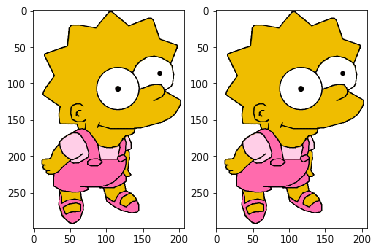

[0.0000e+00 3.1717e+04 5.0000e+00]



Processing image 331 lisa001.bmp


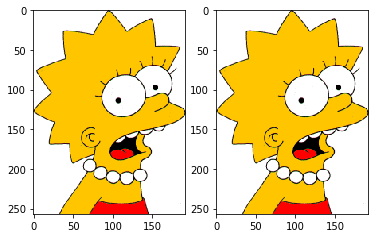

[0.0000e+00 2.2527e+04 2.0000e+00]



Processing image 332 lisa015.bmp


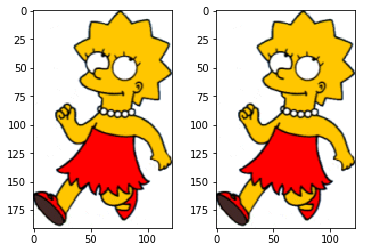

[0.0000e+00 1.1125e+04 2.0000e+00]



Processing image 333 bart036.bmp


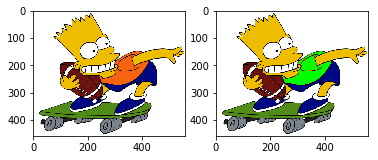

[8.84000e+03 1.58535e+05 2.00000e+00]



Processing image 334 bart022.bmp


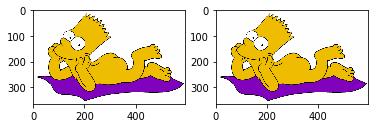

[     0. 124716.      0.]



Processing image 335 maggie013.bmp


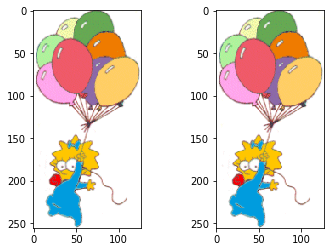

[    0. 16267.     0.]



Processing image 336 other016.bmp


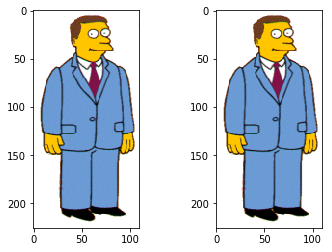

[0.0000e+00 1.0154e+04 3.0000e+00]



Processing image 337 other002.bmp


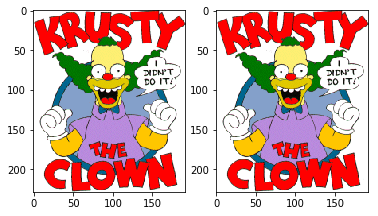

[0.0000e+00 1.5789e+04 6.0000e+00]



Processing image 338 maggie007.bmp


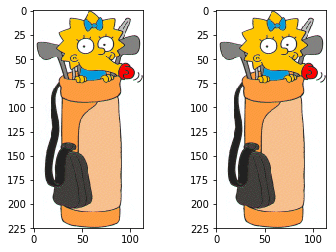

[0.000e+00 9.282e+03 6.000e+00]



Processing image 339 other014.bmp


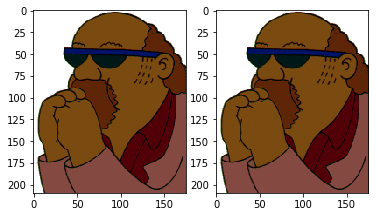

[0.000e+00 7.125e+03 3.000e+00]



Processing image 340 maggie011.bmp


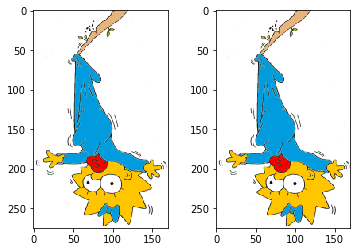

[0.0000e+00 3.3281e+04 6.0000e+00]



Processing image 341 maggie005.bmp


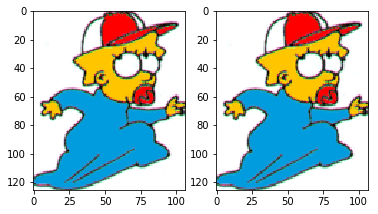

[0.00e+00 5.56e+03 3.00e+00]



Processing image 342 other028.bmp


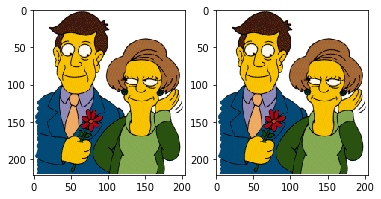

[0.0000e+00 1.3612e+04 3.0000e+00]



Processing image 343 bart034.bmp


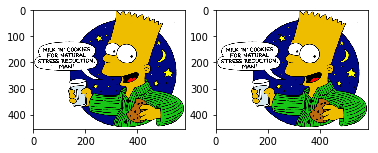

[0.00000e+00 1.26105e+05 6.00000e+00]



Processing image 344 bart020.bmp


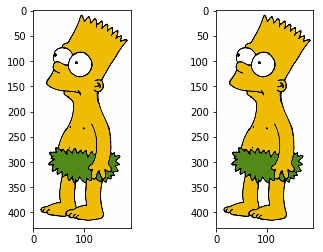

[    0. 47041.     0.]



Processing image 345 bart008.bmp


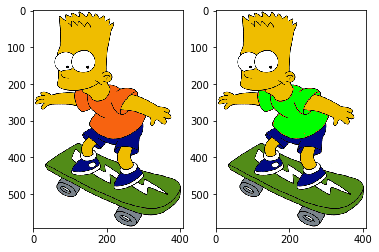

[ 14139. 144248.      0.]



Processing image 346 lisa003.bmp


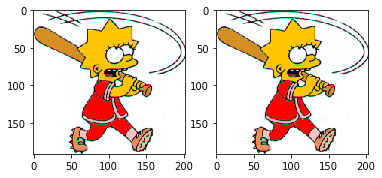

[    0. 22146.     0.]



Processing image 347 lisa017.bmp


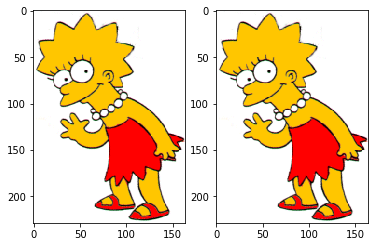

[0.000e+00 2.103e+04 2.000e+00]



Processing image 348 family021.bmp


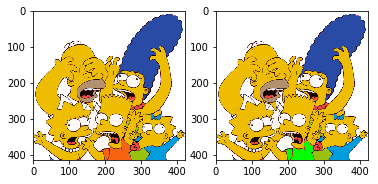

[2.5100e+03 6.2926e+04 2.0000e+00]



Processing image 349 family009.bmp


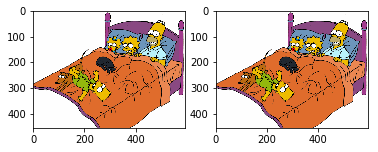

[0.00000e+00 1.18403e+05 5.00000e+00]



Processing image 350 family008.bmp


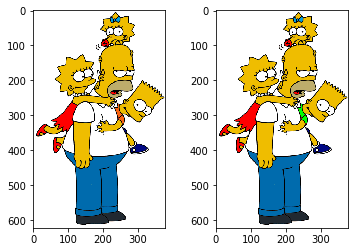

[4.49000e+02 1.54633e+05 5.00000e+00]



Processing image 351 family020.bmp


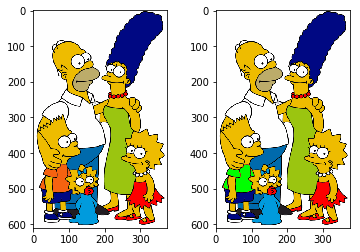

[3.33800e+03 1.11242e+05 5.00000e+00]



Processing image 352 lisa016.bmp


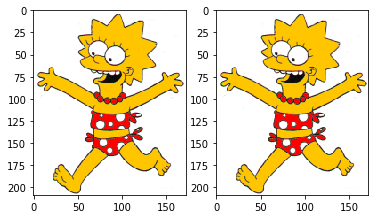

[0.0000e+00 2.2736e+04 5.0000e+00]



Processing image 353 lisa002.bmp


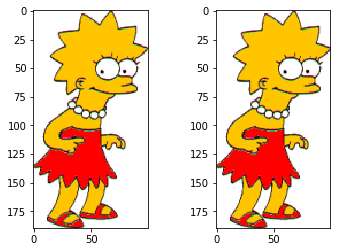

[0.000e+00 9.088e+03 2.000e+00]



Processing image 354 bart009.bmp


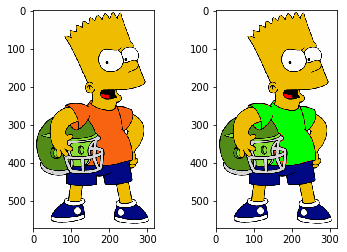

[1.4349e+04 9.3708e+04 2.0000e+00]



Processing image 355 bart021.bmp


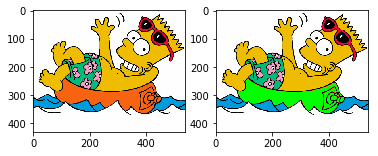

[ 19136. 124228.      0.]



Processing image 356 bart035.bmp


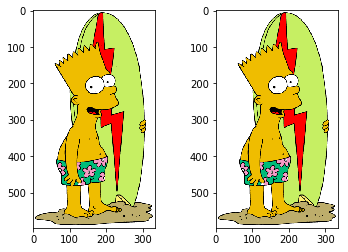

[    0. 87737.     0.]



Processing image 357 other029.bmp


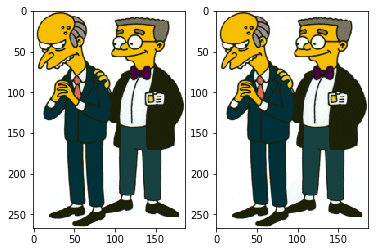

[    0. 17998.     0.]



Processing image 358 maggie004.bmp


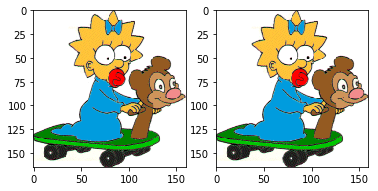

[0.0000e+00 1.3346e+04 6.0000e+00]



Processing image 359 other001.bmp


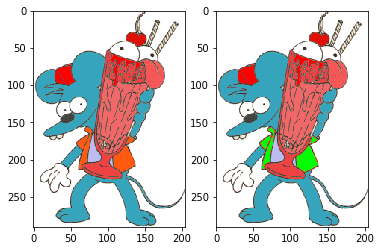

[9.7900e+02 3.4272e+04 3.0000e+00]



Processing image 360 other015.bmp


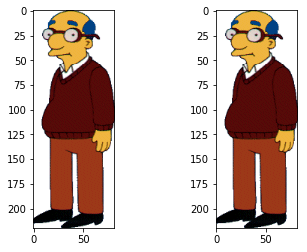

[   0. 5965.    6.]



Processing image 361 maggie010.bmp


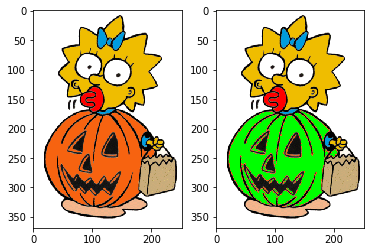

[1.4537e+04 4.4228e+04 6.0000e+00]



Processing image 362 maggie028.bmp


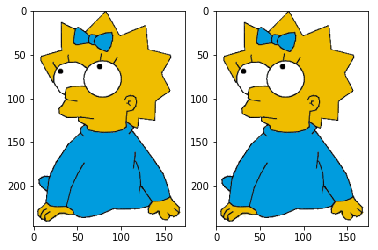

[0.0000e+00 1.9284e+04 3.0000e+00]



Processing image 363 other039.bmp


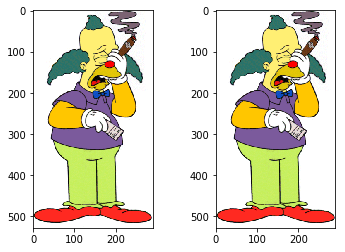

[0.0000e+00 7.2934e+04 3.0000e+00]



Processing image 364 maggie014.bmp


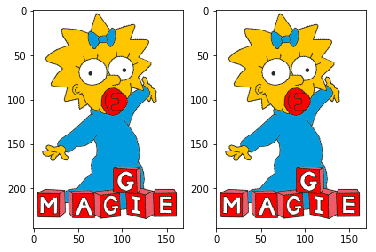

[0.0000e+00 2.2484e+04 6.0000e+00]



Processing image 365 other011.bmp


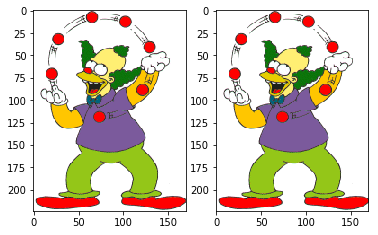

[0.0000e+00 2.1934e+04 3.0000e+00]



Processing image 366 other005.bmp


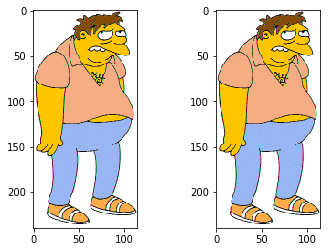

[0.0000e+00 1.0032e+04 6.0000e+00]



Processing image 367 bart019.bmp


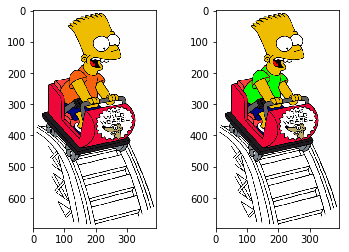

[5.72400e+03 1.88393e+05 6.00000e+00]



Processing image 368 bart031.bmp


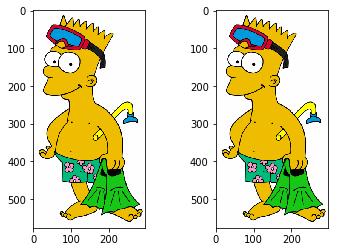

[    0. 91007.     0.]



Processing image 369 bart025.bmp


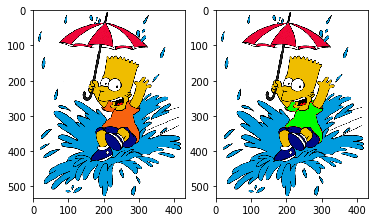

[  4730. 143372.      0.]



Processing image 370 lisa006.bmp


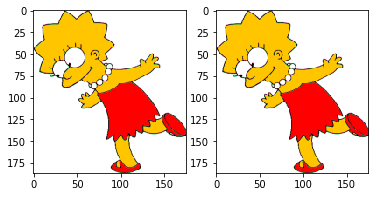

[    0. 20807.     0.]



Processing image 371 lisa012.bmp


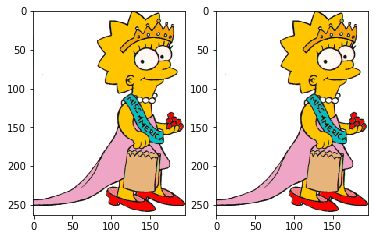

[0.0000e+00 3.0463e+04 2.0000e+00]



Processing image 372 homer062.bmp


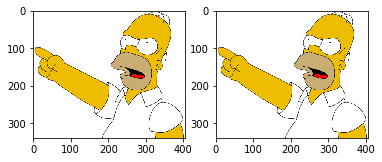

[0.00e+00 9.92e+04 2.00e+00]



Processing image 373 family018.bmp


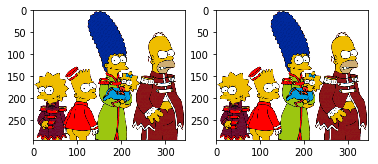

[0.0000e+00 4.8532e+04 1.0000e+00]



Processing image 374 family024.bmp


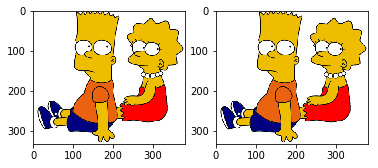

[0.0000e+00 7.2072e+04 5.0000e+00]



Processing image 375 family025.bmp


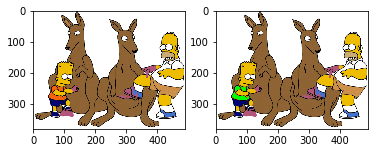

[1.0310e+03 9.9726e+04 5.0000e+00]



Processing image 376 family019.bmp


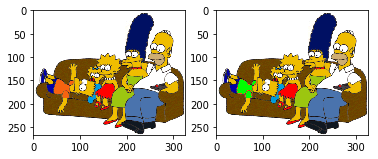

[8.5100e+02 4.3103e+04 5.0000e+00]



Processing image 377 lisa013.bmp


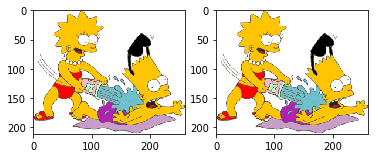

[0.000e+00 2.992e+04 5.000e+00]



Processing image 378 lisa007.bmp


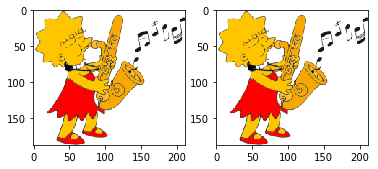

[0.0000e+00 2.4508e+04 2.0000e+00]



Processing image 379 bart024.bmp


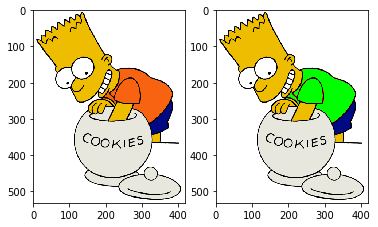

[1.35980e+04 1.26016e+05 2.00000e+00]



Processing image 380 bart030.bmp


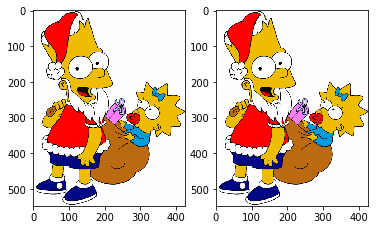

[     0. 140511.      0.]



Processing image 381 bart018.bmp


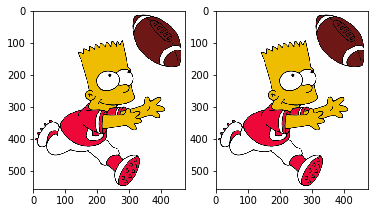

[     0. 192959.      0.]



Processing image 382 other004.bmp


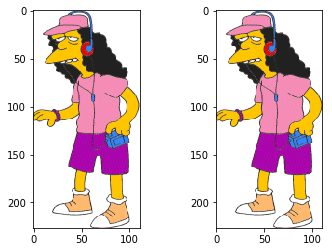

[    0. 12661.     0.]



Processing image 383 maggie001.bmp


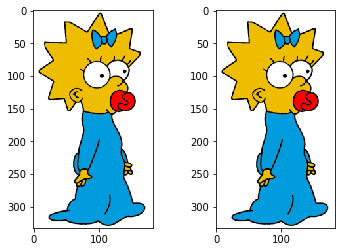

[0.0000e+00 3.2336e+04 6.0000e+00]



Processing image 384 maggie015.bmp


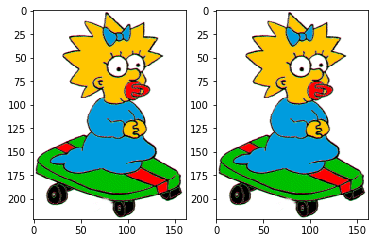

[0.0000e+00 1.8323e+04 3.0000e+00]



Processing image 385 other010.bmp


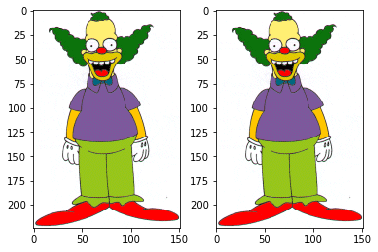

[0.000e+00 1.796e+04 3.000e+00]



Processing image 386 other038.bmp


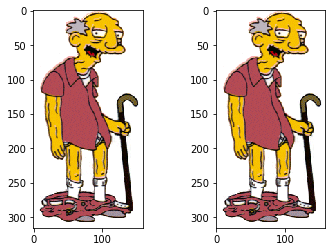

[0.0000e+00 2.4625e+04 6.0000e+00]



Processing image 387 maggie029.bmp


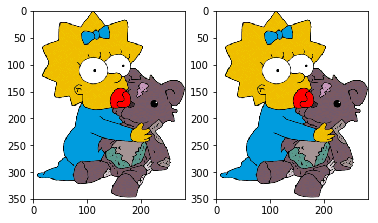

[0.000e+00 4.603e+04 6.000e+00]



Processing image 388 maggie003.bmp


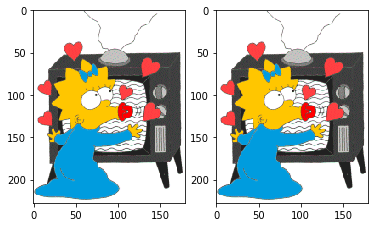

[0.000e+00 1.738e+04 3.000e+00]



Processing image 389 other006.bmp


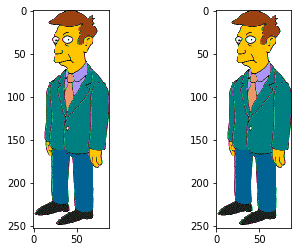

[0.000e+00 8.925e+03 3.000e+00]



Processing image 390 other012.bmp


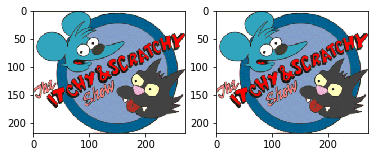

[0.0000e+00 1.5796e+04 6.0000e+00]



Processing image 391 maggie017.bmp


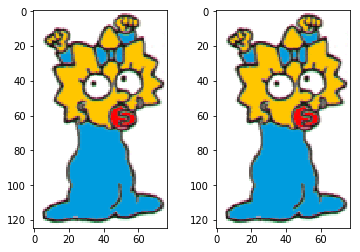

[   0. 4181.    6.]



Processing image 392 bart026.bmp


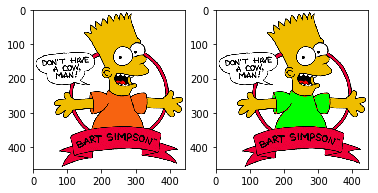

[1.30890e+04 1.28567e+05 3.00000e+00]



Processing image 393 bart032.bmp


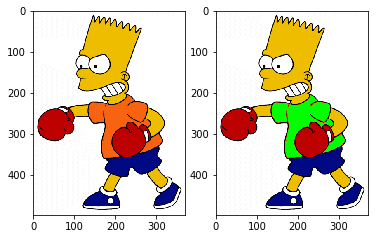

[  9896. 115638.      0.]



Processing image 394 lisa011.bmp


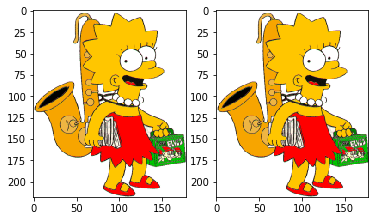

[    0. 19134.     0.]



Processing image 395 lisa005.bmp


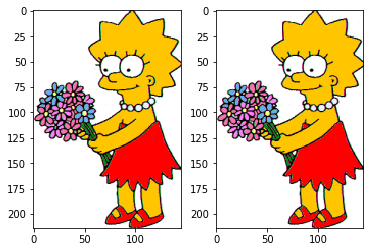

[0.0000e+00 1.5636e+04 2.0000e+00]



Processing image 396 homer061.bmp


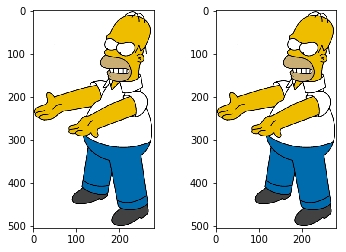

[0.0000e+00 9.0509e+04 2.0000e+00]



Processing image 397 family027.bmp


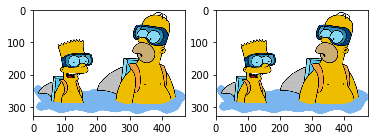

[0.0000e+00 8.0963e+04 1.0000e+00]



Processing image 398 homer049.bmp


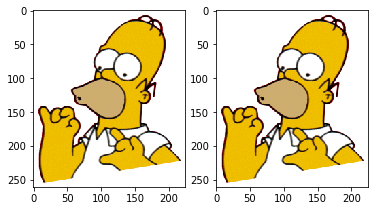

[0.0000e+00 3.4152e+04 5.0000e+00]



Processing image 399 family026.bmp


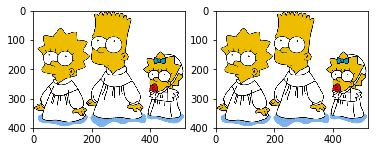

[0.00000e+00 1.37997e+05 1.00000e+00]



Processing image 400 homer048.bmp


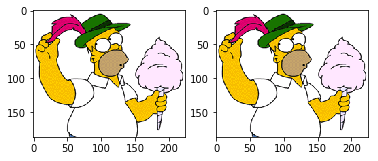

[0.0000e+00 2.5834e+04 5.0000e+00]



Processing image 401 homer060.bmp


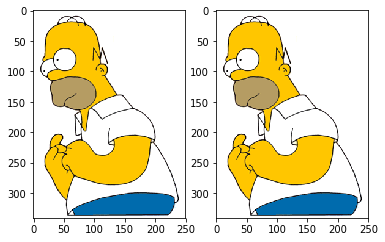

[0.000e+00 5.425e+04 1.000e+00]



Processing image 402 lisa004.bmp


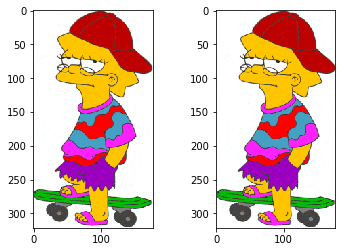

[0.00e+00 2.46e+04 1.00e+00]



Processing image 403 lisa010.bmp


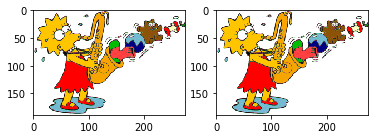

[0.0000e+00 3.2204e+04 2.0000e+00]



Processing image 404 bart033.bmp


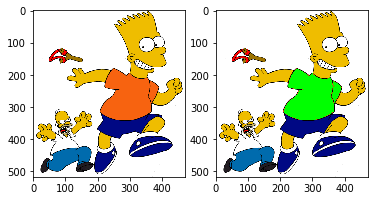

[1.86610e+04 1.54784e+05 2.00000e+00]



Processing image 405 bart027.bmp


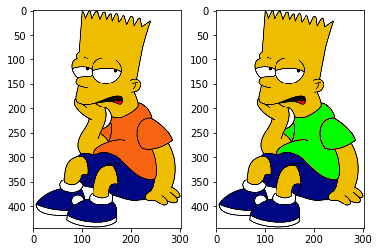

[11256. 67189.     0.]



Processing image 406 other013.bmp


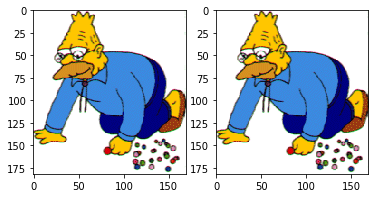

[    0. 15797.     0.]



Processing image 407 maggie016.bmp


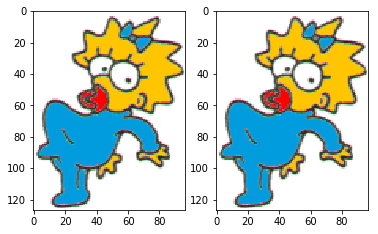

[0.000e+00 6.025e+03 6.000e+00]



Processing image 408 maggie002.bmp


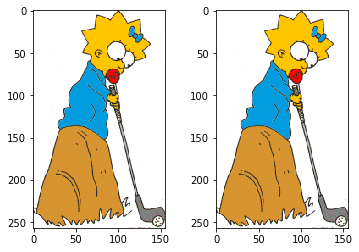

[0.0000e+00 2.1935e+04 3.0000e+00]



Processing image 409 other007.bmp


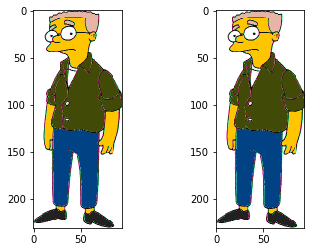

[0.000e+00 9.056e+03 3.000e+00]



Feature extraction ended successfully


In [14]:
# So, let's take each image in our list, open it and scan the pixels looking for the pixel values
# that we are interested in.

dirs = os.listdir( train_path )

img_count = 0

# Loop for each image in the list
for file_name in dirs:
        # Read the image
        img_color        = cv2.imread(train_path+file_name,-1)

        # Create a copy of the image 
        img_color_cloned = img_color.copy()

        # Initialize variables with zero 
        orange = 0
        white  = 0

        print ("Processing image " +str(img_count+1)+" "+file_name ) 
        
        # Loop that reads each image pixel
        for i in range(len(img_color)):
            for j in range(len(img_color[0])):
                # The images are RGB colore, so we need to read each channel and writes it into the blue,
                # green and red variables. In fact OpenCV read an image as BGR, so channel 0 = B,
                # channel 1 = G and channel R = 2.

                red = img_color[i][j][2]
                gre = img_color[i][j][1]
                blu = img_color[i][j][0]
        
                # Shows the pixel value at the screen
                # print(blu, gre, red) 
                # print(img_color[i][j]) 
                
                # Here starts the feature extraction....
                # Detect and count the number of orange pixels
                # Verify if the pixels have a given value ( Orange, is defined as red[240-255], green[85-105],
                # blue[11-22] ). We use interval to capture different levels of orange. If so, count it...
                if blu >= 11 and blu <= 22 and gre >= 85 and gre <=105 and red >= 240 and red <= 255:
                    orange += 1
                    # Just to be sure we are doing the right thing,
                    # we change the color of the orange pixels to green [R=0, G=255, B=0] and
                    # show them into a cloned image 
                    img_color_cloned[i][j] = [0,255,0]

                # Detect and count the number of white pixels (just a dummy feature...)
                # Verify if the pixels have a given value ( White, defined as red[253-255], green[253-255], blue[253-255] ). If so, count it...
                elif blu >= 253 and gre >= 253 and red >= 253:
                     white += 1

                # Here you can add your own features....... Good luck
                # < FILL IN >      
                
        # Lets make our counting somewhat independent on the image size...
        # Compute the percentage of pixels of a given colour.
        # Normalize the feature by the image size
        # orange = orange / ( len(img_color) * len(img_color[0]) );
        # white  = white  / ( len(img_color) * len(img_color[0]) );

        
        # Show processed image
        RGB_img = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)    
        RGB_img_cloned = cv2.cvtColor(img_color_cloned, cv2.COLOR_BGR2RGB)    
        f, axarr = plt.subplots(1,2)
        axarr[0].imshow(RGB_img)
        axarr[1].imshow(RGB_img_cloned)           
        plt.show()
            
        # Store the feature value in the columns of the feature (matrix) vector
        feature_vector[img_count] = [orange, white, label_train[img_count]]
        print (feature_vector[img_count]) 
        print ("\n\n") 
        
        img_count += 1
        
        # Save the extracted feature vector into a text file.
        np.savetxt(filename, feature_vector, delimiter=",")
        
print("Feature extraction ended successfully")

In [15]:
print("\nFeature extraction ended successfully. "+str(img_count)+" images processed.")
print("Feature vectors saved in "+str(filename)+"\n")


Feature extraction ended successfully. 409 images processed.
Feature vectors saved in simpsons_train.csv



In [16]:
print("\nNotebook ended\n")


Notebook ended



## Now it is your time to play with this notebook.

#### 1) Propose and extract two new features

#### 2) Add these new features to the previous feature vector. You have to augment the dimensionality of your vector.

#### 3) Extract the same features for the validation set and write the result into a new csv file.